# Getting started with Task 3

Download the dataset from the [Dataset of Simulated Intracardiac Transmembrane Voltage Recordings and ECG Signals](https://library.ucsd.edu/dc/object/bb29449106) using the script `download_intracardiac_dataset.sh`:

```bash
source download_intracardiac_dataset.sh
```

## Load Modules and Preprocessing Functions

Load modules and preprocessing functions.

In [13]:
from google.colab import drive
drive.mount('/content/drive')

ModuleNotFoundError: No module named 'google'

In [1]:
drive_path = '/content/drive/MyDrive/cardiac_challenge_team6'
local_path = '../'

In [2]:
import glob, re, os
import numpy as np
import matplotlib.pyplot as plt
from typing import List

In [ ]:
#drive_path = '/content/drive/MyDrive/cardiac_challenge_team6'


Load the `cardiac_ml_tools` module.

In [3]:
%run $local_path/notebooks/cardiac_ml_tools.py

## Load the dataset

In [4]:
data_dirs = []
regex = r'data_hearts_dd_0p2*'
DIR= '../intracardiac_dataset/'  # This should be the path to the intracardiac_dataset, it can be downloaded using data_science_challenge_2023/download_intracardiac_dataset.sh
for x in os.listdir(DIR):
    if re.match(regex, x):
        data_dirs.append(DIR + x)
file_pairs = read_data_dirs(data_dirs)
print('Number of file pairs: {}'.format(len(file_pairs)))
# example of file pair
print("Example of file pair:")
print("{}\n{}".format(file_pairs[0][0], file_pairs[0][1]))


Number of file pairs: 0
Example of file pair:


IndexError: list index out of range

## Dataset details

The dataset [Dataset of Simulated Intracardiac Transmembrane Voltage Recordings and ECG Signals](https://library.ucsd.edu/dc/object/bb29449106)
consists of pairs of computationally simulated intracardiac transmembrane voltage recordings and ECG signals.
In total, 16140 organ-level simulations were conducted to create this dataset.
Simulations were performed using Lassen supercomputer at Lawrence Livermore National Lab (LLNL), concurrently utilizing 4 GPUs and 40 CPU cores.
Each simulation produced pairs of 500ms-by-10 raw electrode signals and 500ms-by-75 transmembrane voltage signals.
For convenience, we collect those signals in matrices and give them the following names:

Tensor | Description | Shape | Notes
--- | --- | --- | ---
$X$ | Row electrode signals | $10 \times 500$ | 10-lead ECG signals from the simulated torso (in [Dataset of Simulated Intracardiac Transmembrane Voltage Recordings and ECG Signals](https://library.ucsd.edu/dc/object/bb29449106))
$V$ | Activation map | $75 \times 500$ | Transmembrane voltage signals from the simulated heart (in [Dataset of Simulated Intracardiac Transmembrane Voltage Recordings and ECG Signals](https://library.ucsd.edu/dc/object/bb29449106))
$E$ | 12-lead ECG signals | $12 \times 500$ | 12-lead ECG signals obtained by `get_standard_leads`($X$)
$A$ | Activation map | $75 \times 1$ | Activation time, defined as $A_i = \text{min}_j(V_{ij})$

**IMPORTANT** : The raw data in the dataset consists of 10-lead ECG signals and 75-lead transmembrane voltage signals. The 12-lead ECG signals are obtained from the 10-lead ECG signals using the function `get_standard_leads` (in the file `cardiac_ml_tools.py`).

The overall generation process is shown in the following image. The ECG signal is recorded using 10 virtual electrodes and the transmembrane voltages are recorded at 75 points within the myocardium. The transmembrane voltages are then used to generate the spatio-temporal activation maps.

![ECG 10 2 12](../figures/data_generation.png)

## Getting the standard 12-lead ECG from the 10-lead ECG

The function `get_standard_leads` (in the file `cardiac_ml_tools.py`) is used to obtain the 12-lead ECG signals from the 10-lead ECG signals. It implements the following transformation, where the (Wilson Lead) is defined as $Vw = 1/3*(RA + LA + LL)$:
$$
\left\{
\begin{array}{lll}
    X_{:,1}  & \to  & RA \\
    X_{:,2}  & \to  & LA \\
    X_{:,3}  & \to  & LL \\
    X_{:,4}  & \to  & RL \\
    X_{:,5}  & \to  & V1 \\
    X_{:,6}  & \to  & V2 \\
    X_{:,7}  & \to  & V3 \\
    X_{:,8}  & \to  & V4 \\
    X_{:,9}  & \to  & V5 \\
    X_{:,10} & \to &  V6 \\
\end{array}
\right.
\text{        and        }
\left\{
\begin{array}{lll}          
\text{Lead } I& : & LA - RA \\
\text{Lead } II& : & LL - RA \\
\text{Lead } III& : & LL - LA \\
\text{Lead } aVR& : &  \frac{3}{2} (RA - Vw) \\
\text{Lead } aVL& : &  \frac{3}{2} (LA - Vw) \\
\text{Lead } aVF& : &  \frac{3}{2} (LL - Vw)\\
\text{Lead } V1 & : & V1 - Vw \\
\text{Lead } V2 & : & V2 - Vw \\
\text{Lead } V3 & : & V3 - Vw \\
\text{Lead } V4 & : & V4 - Vw \\
\text{Lead } V5 & : & V5 - Vw \\
\text{Lead } V6 & : & V6 - Vw \\
\end{array}
\right.
$$


Case 213 : /content/drive/MyDrive/cardiac_challenge_team6/intracardiac_dataset/data_hearts_dd_0p2_geo_inn_act_1_bcl/pECGData_hearts_dd_0p2_geo_inn_act_1_bcl_bcl.1000.innerindex.74.volunteer.v14.npy


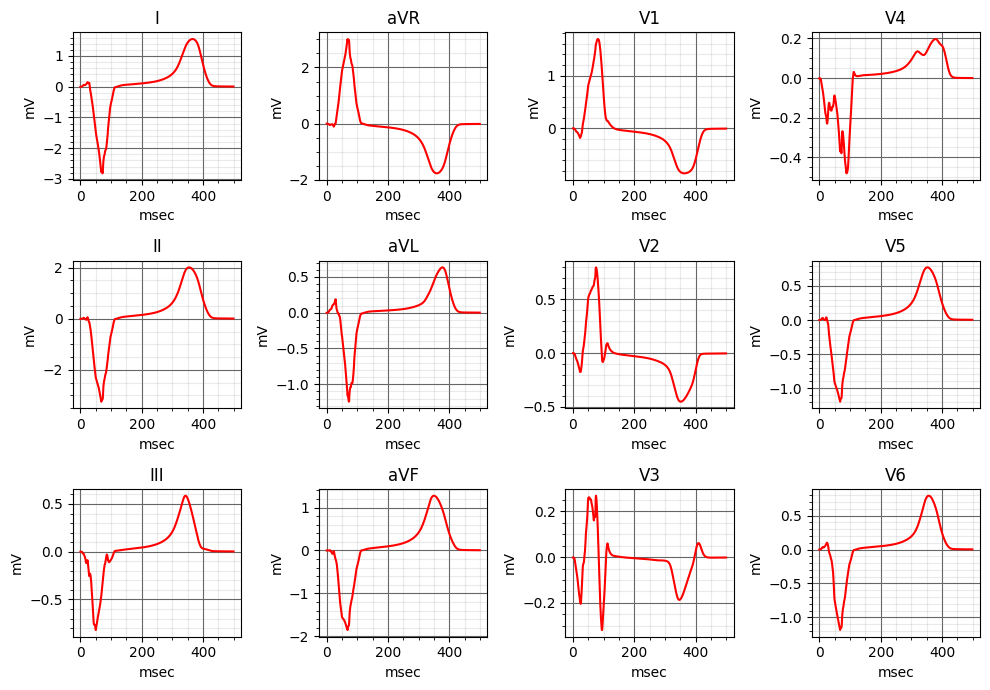

In [ ]:
# Example of file pair
case = 213
# ECG plot
row = 3
column = 4
num_timesteps = 500
plt.figure(figsize=(10, 7))
titles = ["I", "II", "III", "aVR", "aVL", "aVF", "V1", "V2", "V3", "V4", "V5", "V6"]
reorder = {1:1,2:5,3:9,4:2,5:6,6:10,7:3,8:7,9:11,10:4,11:8,12:12} # reorder the leads to standard 12-lead ECG display

print('Case {} : {}'.format(case, file_pairs[case][0]))
pECGData = np.load(file_pairs[case][0])
pECGData = get_standard_leads(pECGData)

# create a figure with 12 subplots
for i in range(pECGData.shape[1]):
    plt.subplot(row, column, reorder[i + 1])
    plt.plot(pECGData[0:num_timesteps,i],'r')
    plt.title(titles[i])
    plt.grid(visible=True, which='major', color='#666666', linestyle='-')
    plt.minorticks_on()
    plt.grid(visible=True, which='minor', color='#999999', linestyle='-', alpha=0.2)
    plt.xlabel('msec')
    plt.ylabel('mV')
plt.tight_layout()
plt.show()
# close
plt.close()

## Getting the transmembrane voltages

Case 213 : /content/drive/MyDrive/cardiac_challenge_team6/intracardiac_dataset/data_hearts_dd_0p2_geo_inn_act_1_bcl/pECGData_hearts_dd_0p2_geo_inn_act_1_bcl_bcl.1000.innerindex.74.volunteer.v14.npy


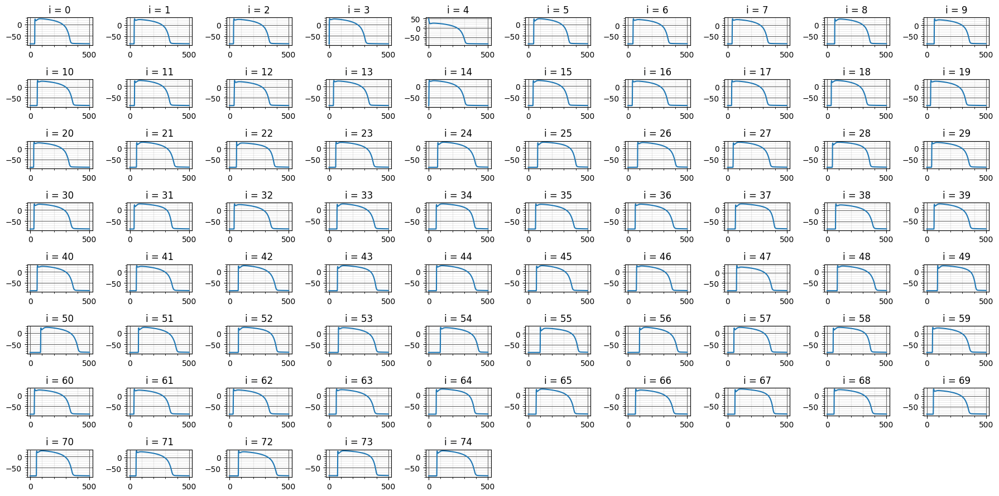

In [ ]:
# Example of file pair
case = 213
# Vm plot
row = 7
column = 10
plt.figure(figsize=(18, 9))

print('Case {} : {}'.format(case, file_pairs[case][0]))
VmData = np.load(file_pairs[case][1])

for count, i in enumerate(range(VmData.shape[1])):
    plt.subplot(8, 10, count + 1)
    plt.plot(VmData[0:num_timesteps,i])
    plt.title(f'i = {i}')
    plt.grid(visible=True, which='major', color='#666666', linestyle='-')
    plt.minorticks_on()
    plt.grid(visible=True, which='minor', color='#999999', linestyle='-', alpha=0.2)
    # plt.xlabel('msec')
    # plt.ylabel('mV')
plt.tight_layout()
plt.show()
# close
plt.close()


## Task 4: Learning the mapping from the 12-lead ECG to the 75 transmembrane voltages

Case 213 : /content/drive/MyDrive/cardiac_challenge_team6/intracardiac_dataset/data_hearts_dd_0p2_geo_inn_act_1_bcl/pECGData_hearts_dd_0p2_geo_inn_act_1_bcl_bcl.1000.innerindex.74.volunteer.v14.npy
Case 213 : /content/drive/MyDrive/cardiac_challenge_team6/intracardiac_dataset/data_hearts_dd_0p2_geo_inn_act_1_bcl/pECGData_hearts_dd_0p2_geo_inn_act_1_bcl_bcl.1000.innerindex.74.volunteer.v14.npy


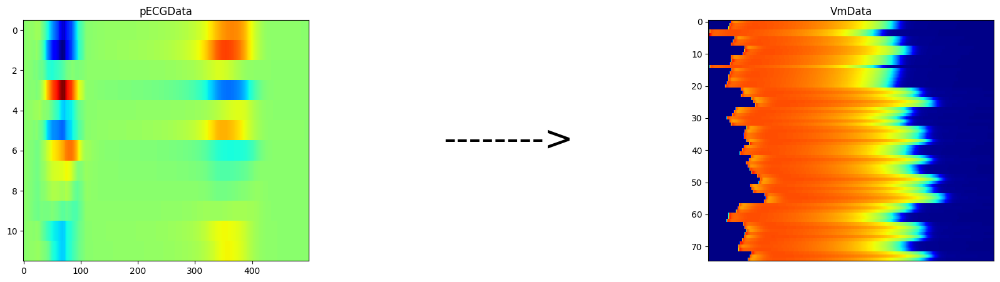

In [ ]:
# make a plot with the "pECGData" -> "ActTime"
case = 213

print('Case {} : {}'.format(case, file_pairs[case][0]))
pECGData = np.load(file_pairs[case][0])
pECGData = get_standard_leads(pECGData)

print('Case {} : {}'.format(case, file_pairs[case][0]))
VmData = np.load(file_pairs[case][1])

# plot in row the tensors pECGData and ActTime with an arrow pointing to the activation time
row = 1
column = 3
plt.figure(figsize=(20, 5))
plt.subplot(row, column, 1)
# plot pECGData transposed
plt.imshow(pECGData.T, cmap='jet', interpolation='nearest', aspect='auto')
plt.title('pECGData')
plt.subplot(row, column, 2)
# print a text "->"
plt.text(0.5, 0.5, '-------->', fontsize=40, horizontalalignment='center', verticalalignment='center')
plt.axis('off')
plt.subplot(row, column, 3)
# plot Vm transposed
plt.imshow(VmData.T, cmap='jet', interpolation='nearest', aspect='auto')
# not xticks
plt.xticks([])
plt.title('VmData')
plt.show()
plt.close()

# Tricks

- As in many machine learning problems, normalization of the data might be helpful or even necessary. Different normalization schemes might be applied.

In [6]:
import torch
import torch.nn as nn
from torch.optim import Adam
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt

In [8]:
ECG_Data = np.load('../Task_3_4_Data/ECG_Data.npy')
VMData = np.load('../Task_3_4_Data/VmData.npy')

In [9]:
# grabbing data
X_tensor = torch.from_numpy(ECG_Data).type(torch.float)
Y_tensor = torch.from_numpy(VMData).type(torch.float)
print(X_tensor.shape, '\n', Y_tensor.shape)
print(X_tensor[0][100], '\n', Y_tensor[0][100]) # print 0th heart sample at t=101

torch.Size([16117, 500, 12]) 
 torch.Size([16117, 500, 75])
tensor([-0.0014,  0.0083,  0.0097, -0.0034, -0.0056,  0.0090,  0.0021, -0.0014,
         0.0007,  0.0023,  0.0039,  0.0063]) 
 tensor([24.6609, 24.5553, 24.4055, 24.5439, 24.4577, 24.3764, 24.6604, 24.5641,
        24.4174, 25.0265, 24.6343, 24.5291, 24.7374, 24.3975, 25.0184, 25.0153,
        24.4213, 24.5644, 24.6627, 24.8109, 24.6917, 24.4511, 25.0436, 26.0649,
        25.0323, 24.9845, 26.1634, 25.0648, 24.9748, 26.4006, 25.0508, 24.7840,
        26.5866, 25.1547, 25.0598, 26.2675, 25.1269, 25.1288, 26.3798, 25.0673,
        25.0433, 26.3086, 25.0611, 25.0988, 26.3413, 25.2381, 26.2128, 25.0966,
        24.7818, 25.3547, 26.4785, 24.9585, 26.0352, 25.0336, 26.0773, 25.0546,
        25.0500, 24.5526, 24.8313, 24.5689, 25.1750, 24.8400, 26.1577, 24.8356,
        26.1225, 25.2292, 24.9840, 26.5760, 24.8901, 24.8413, 24.7092, 24.4762,
        24.9963, 26.5006, 25.2409])


torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.000

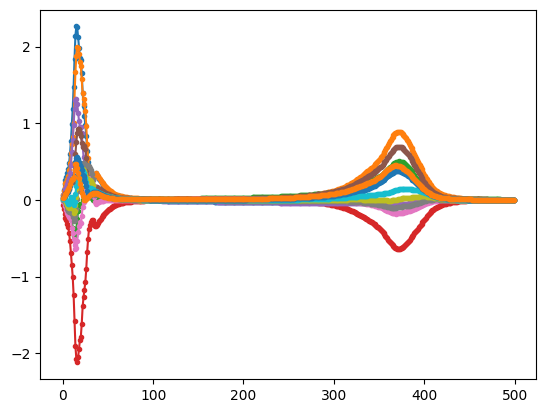

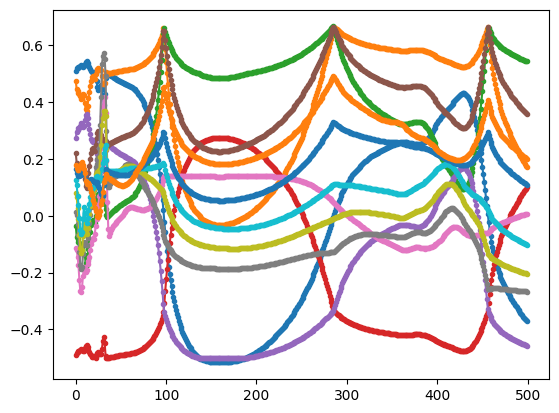

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.000

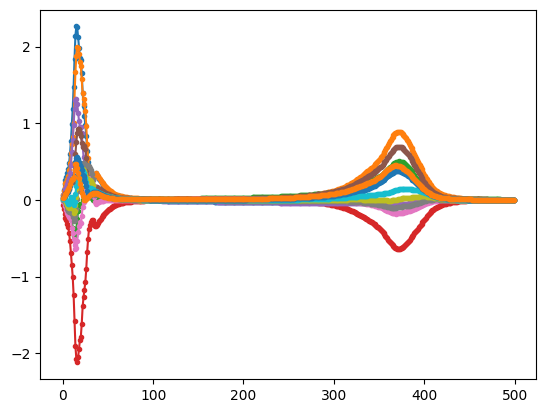

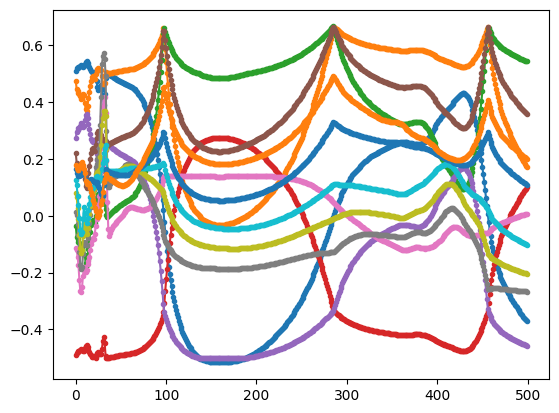

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

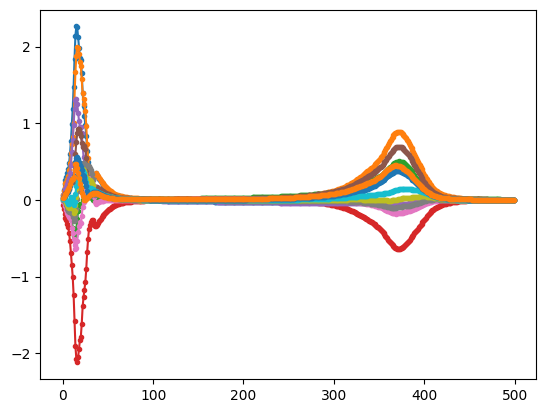

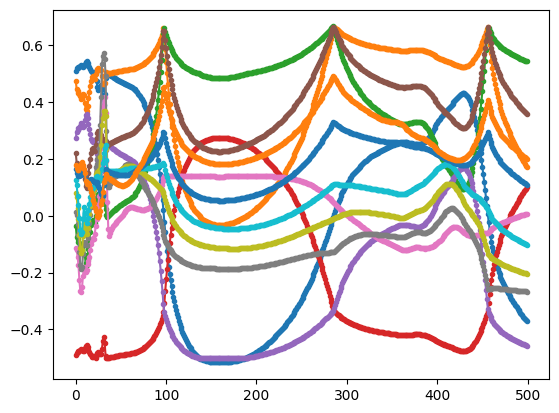

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

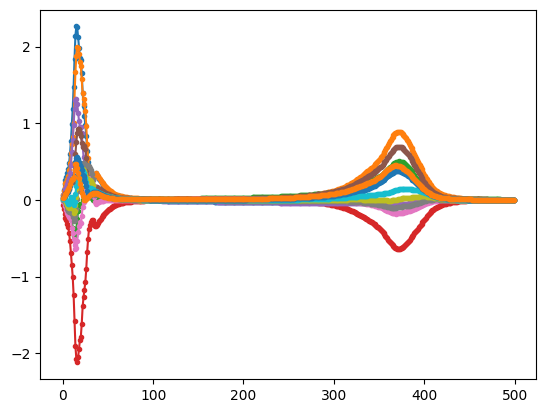

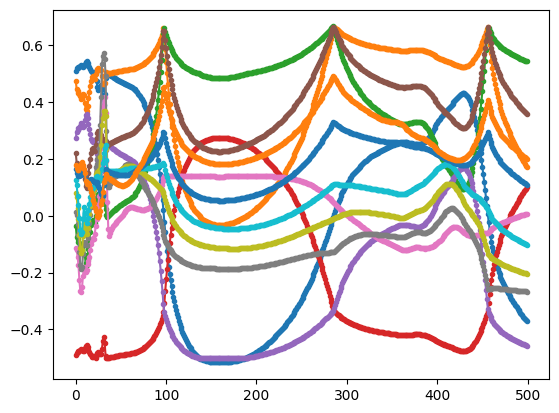

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

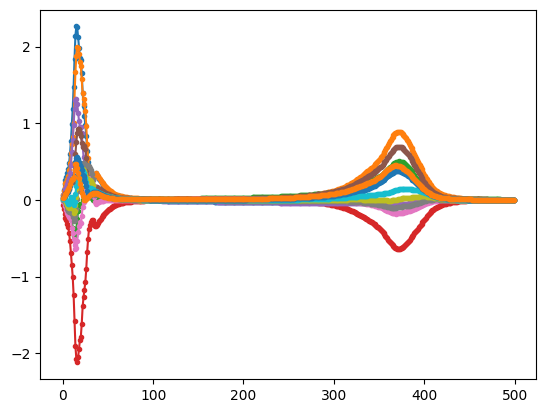

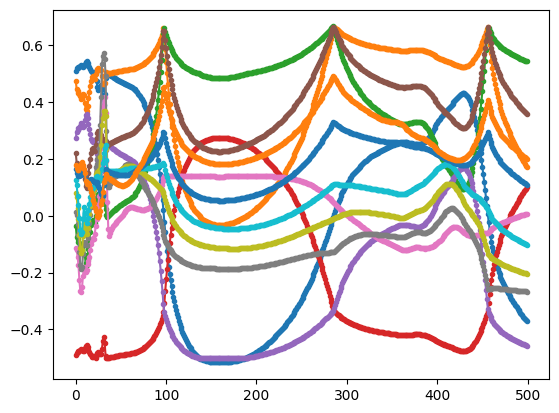

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

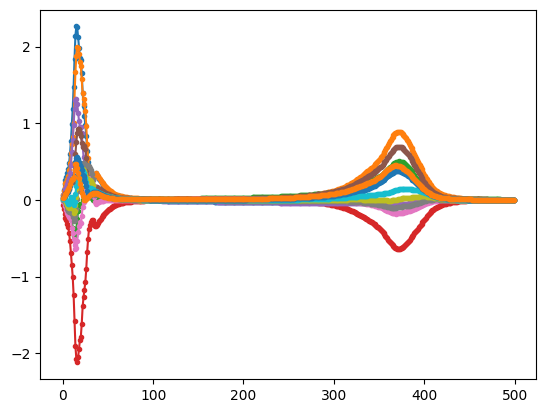

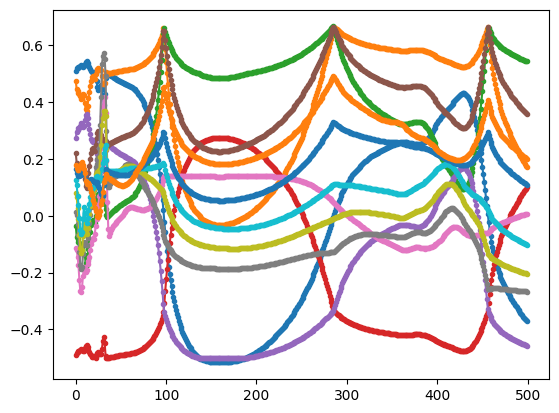

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

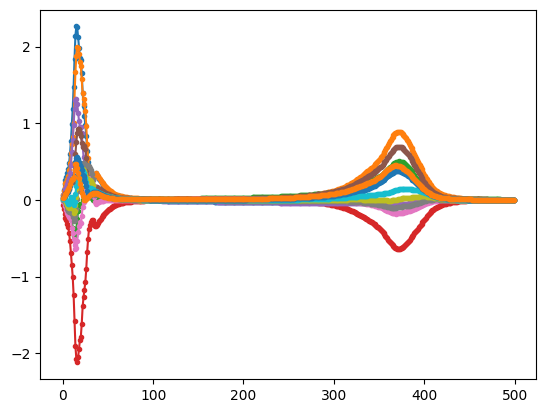

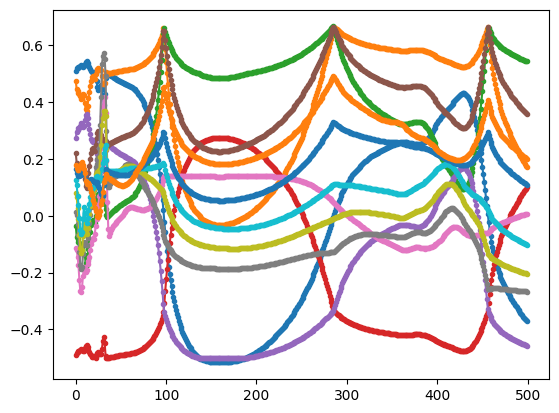

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

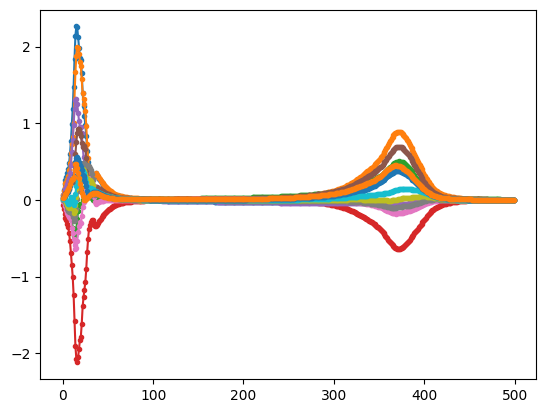

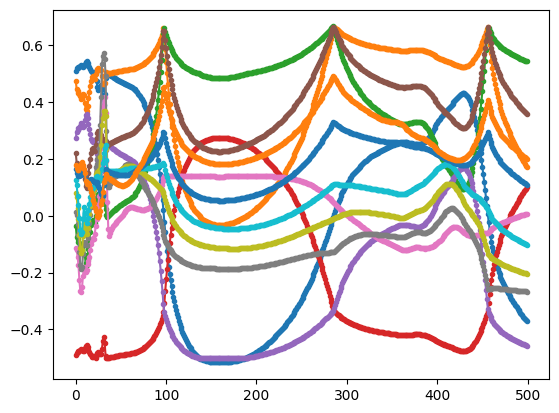

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

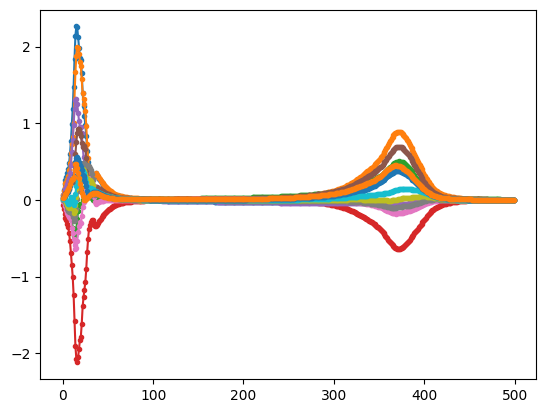

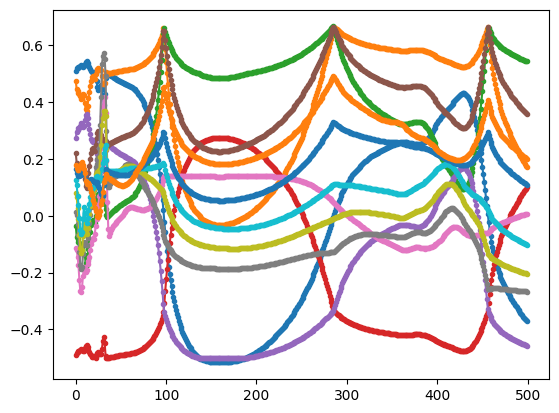

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

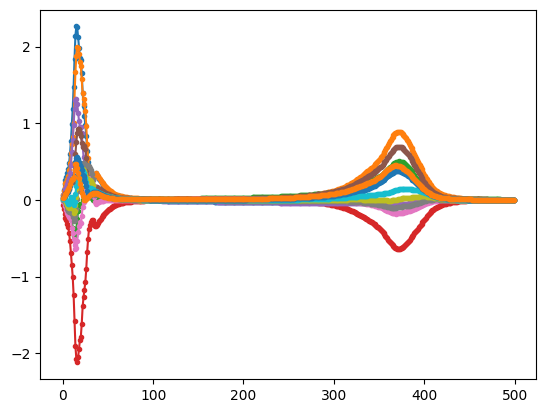

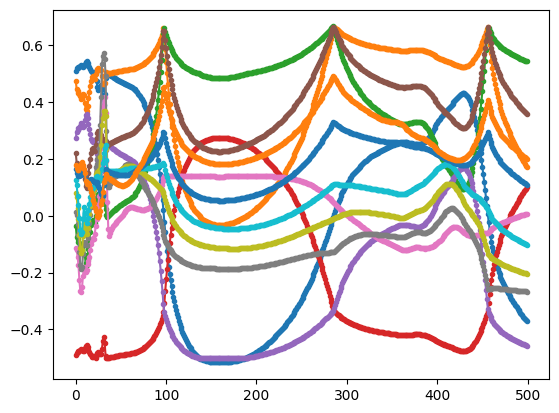

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

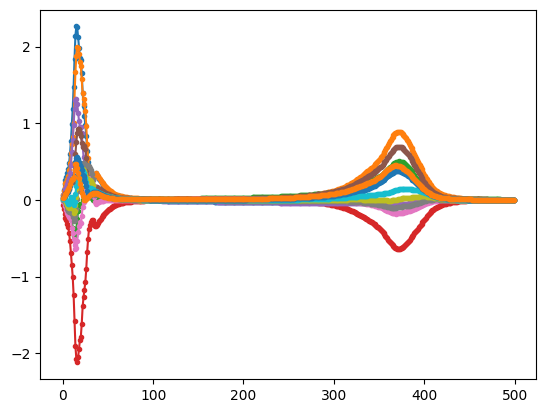

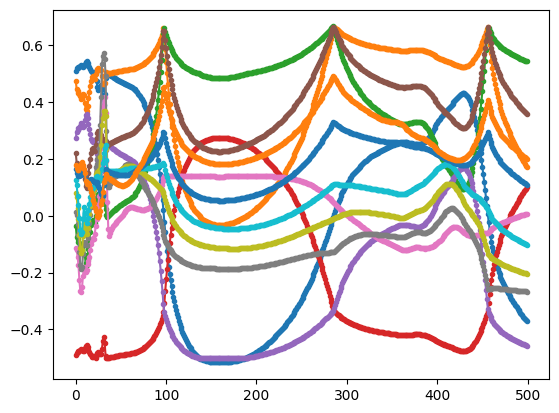

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

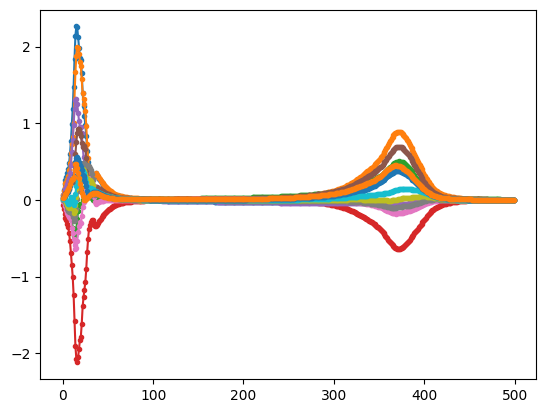

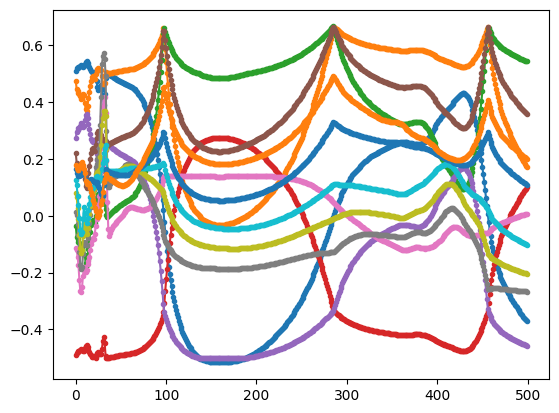

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

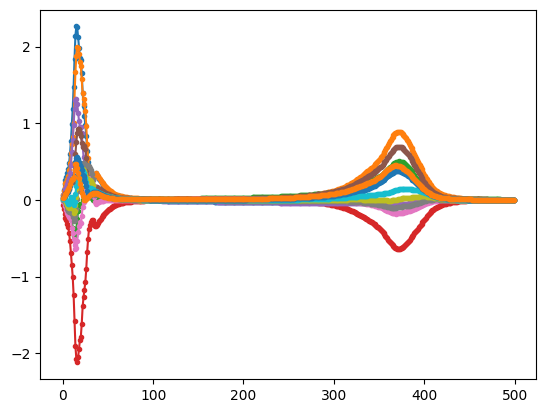

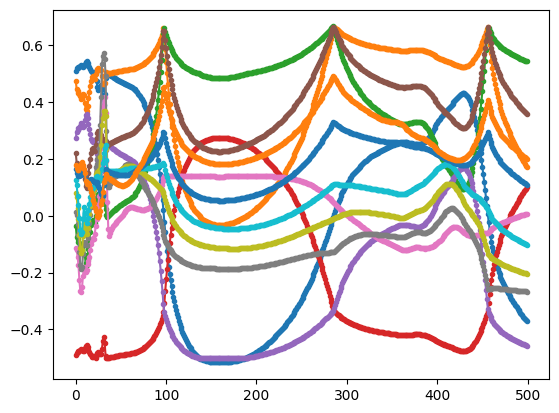

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

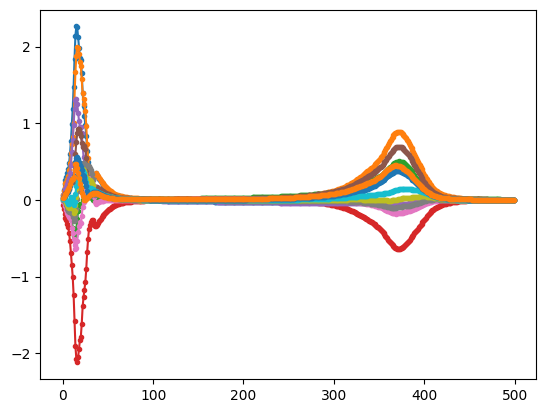

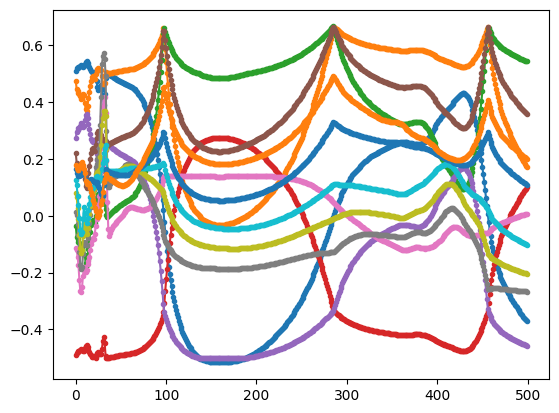

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

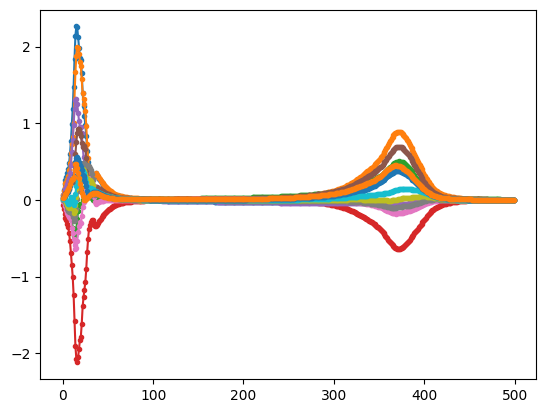

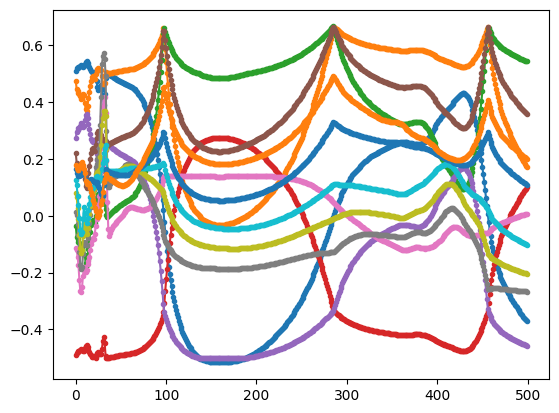

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

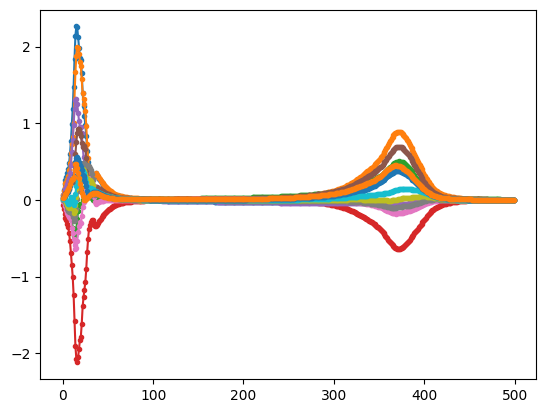

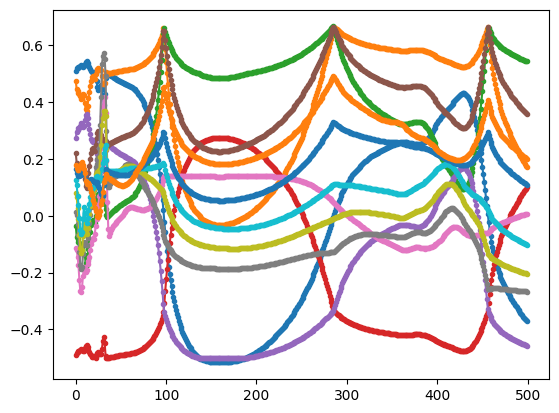

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

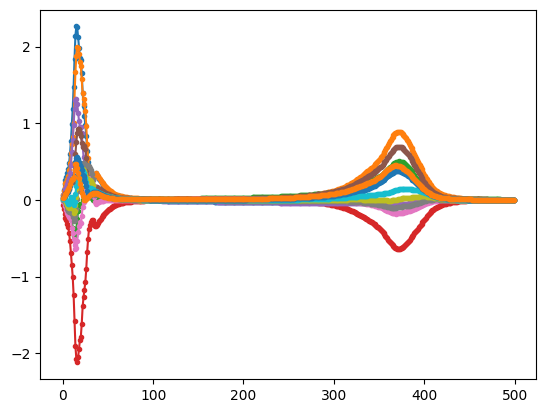

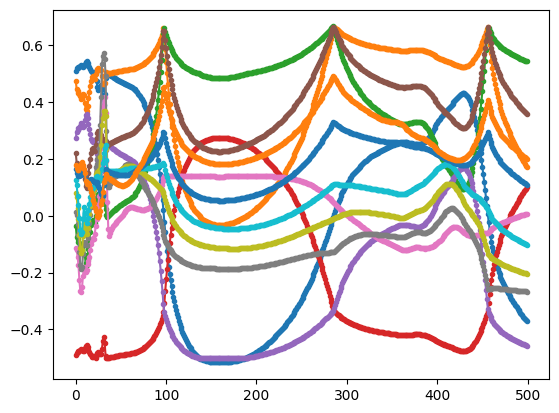

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

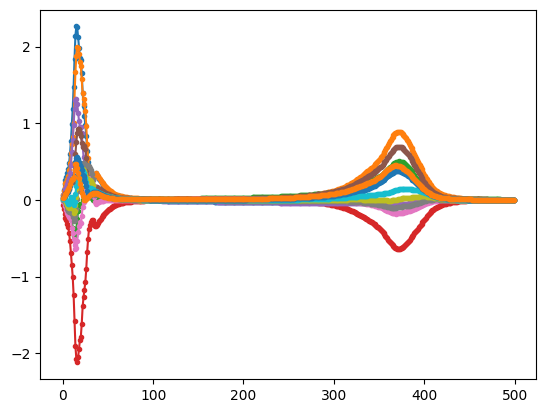

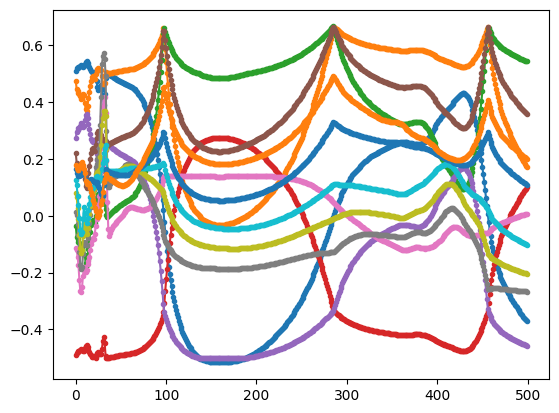

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

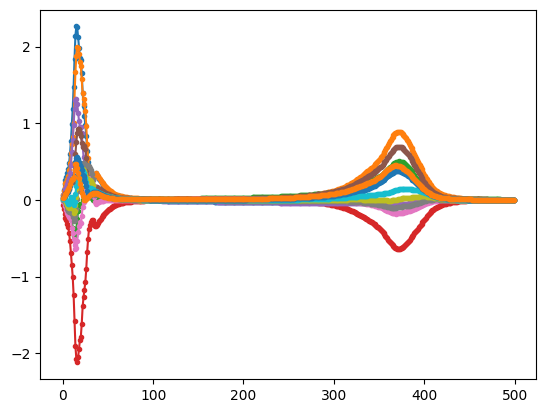

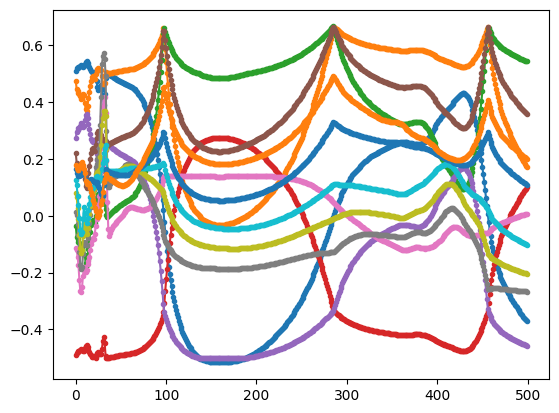

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

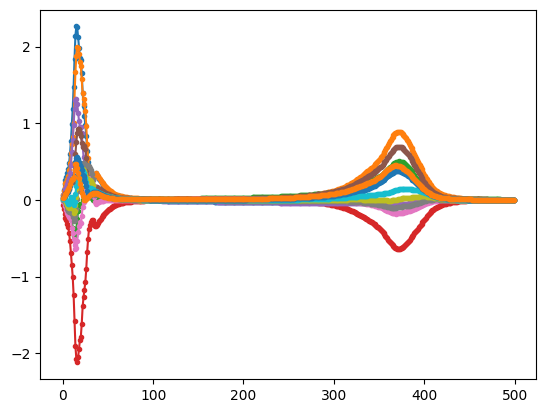

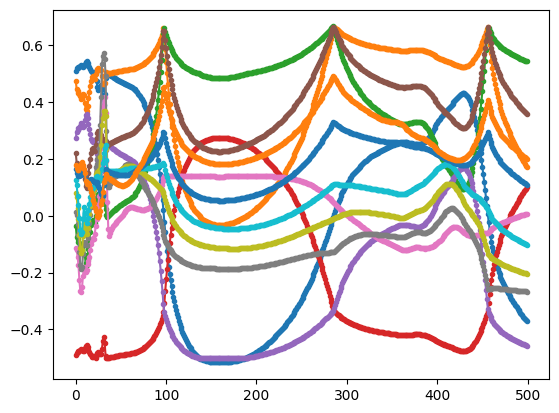

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

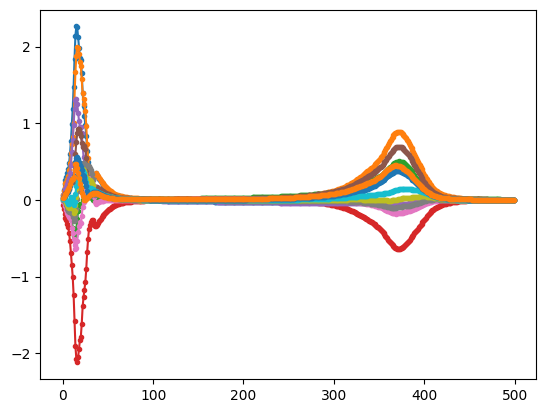

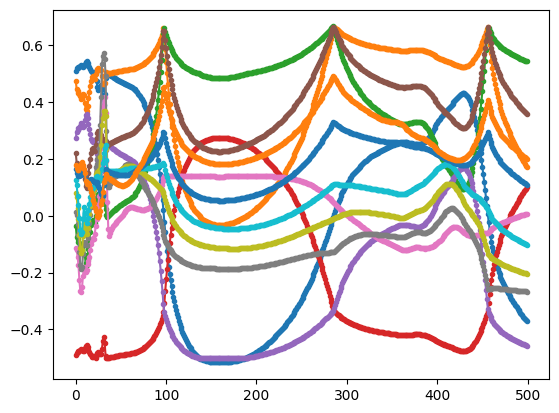

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

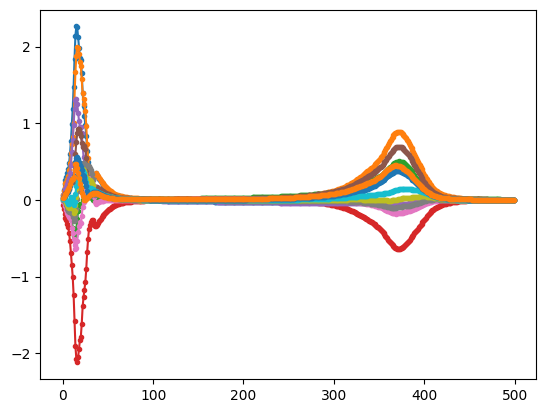

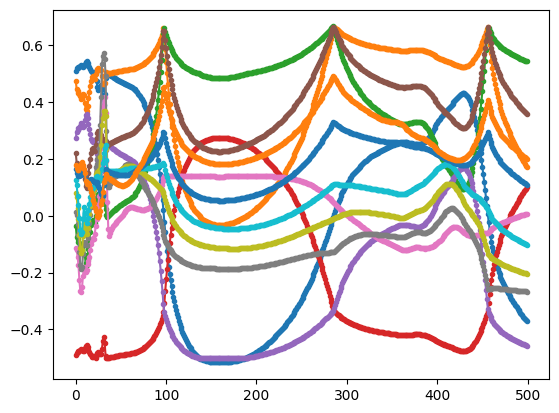

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

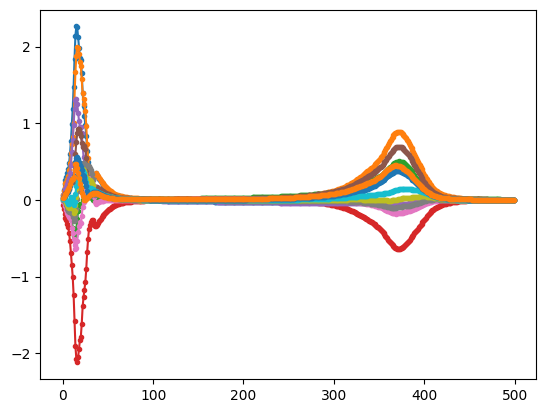

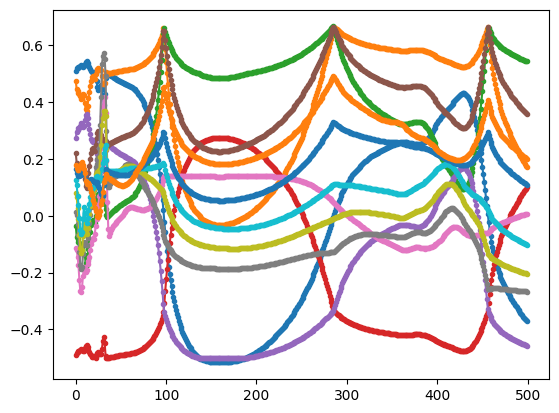

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

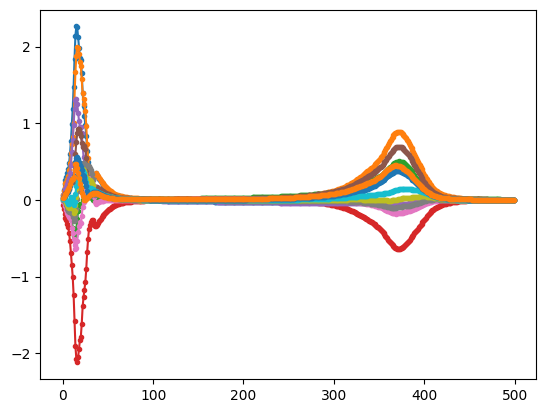

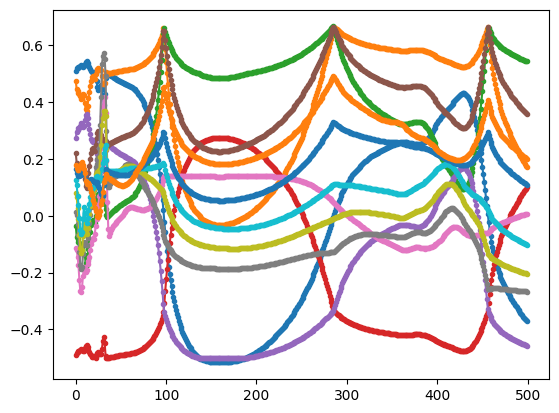

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

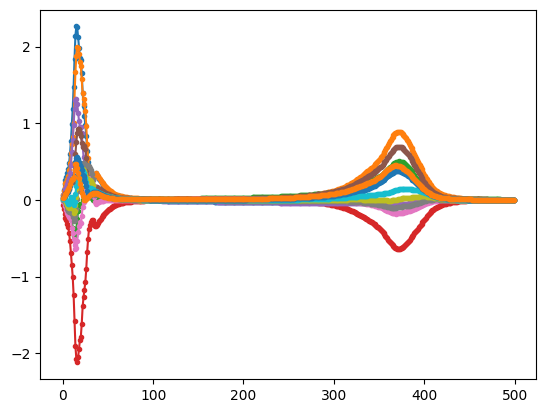

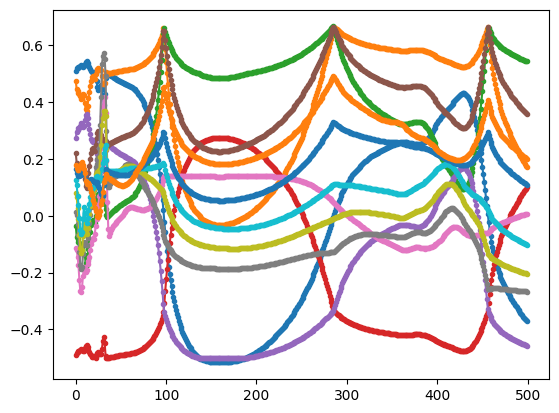

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

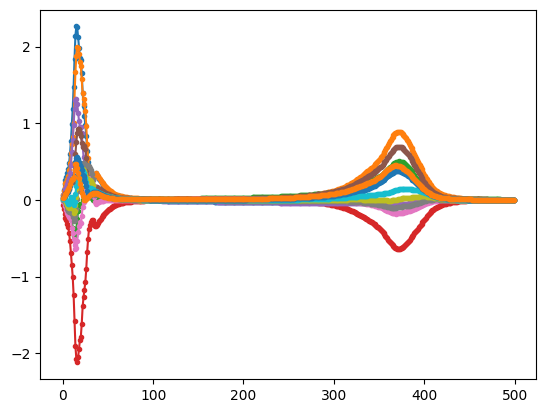

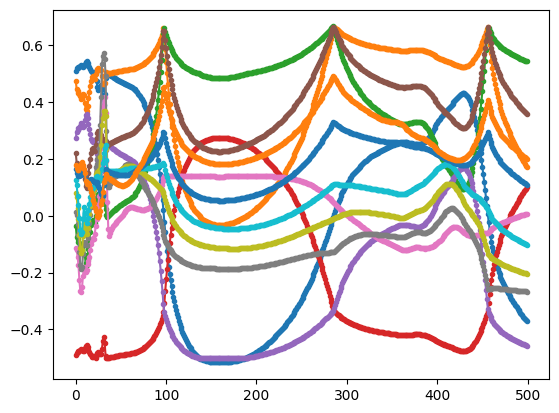

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

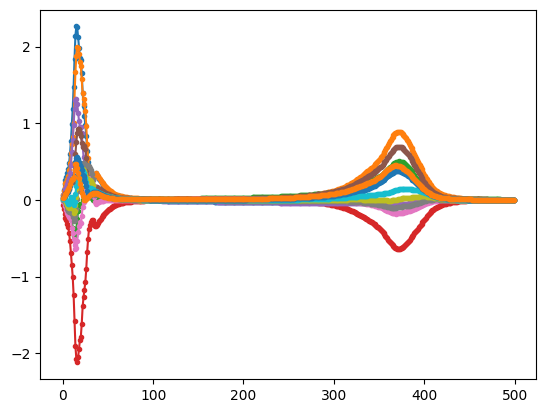

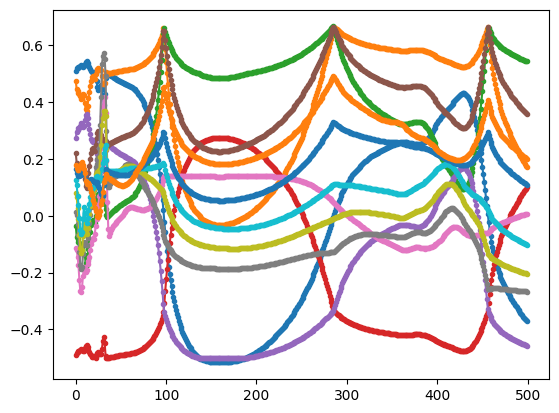

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

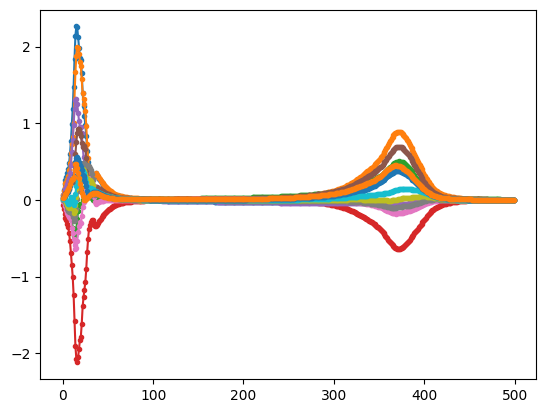

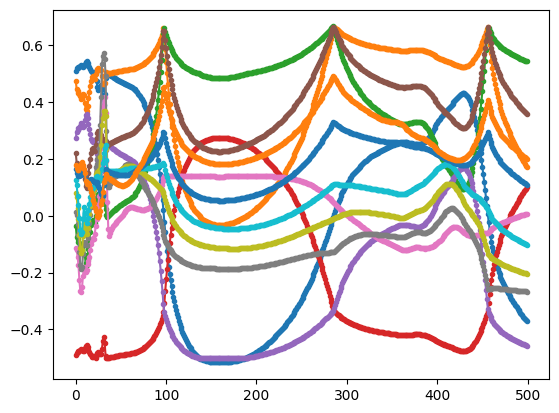

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

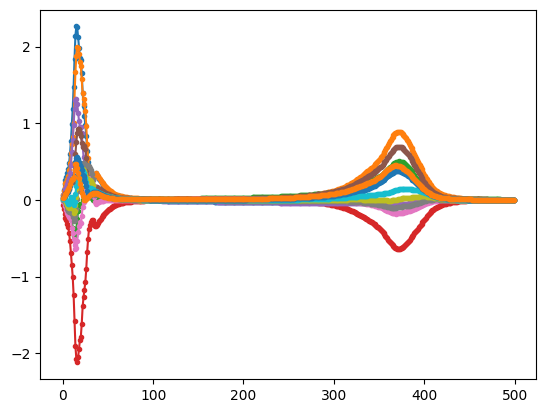

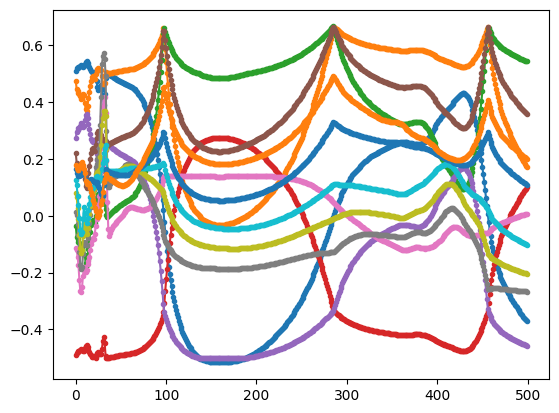

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

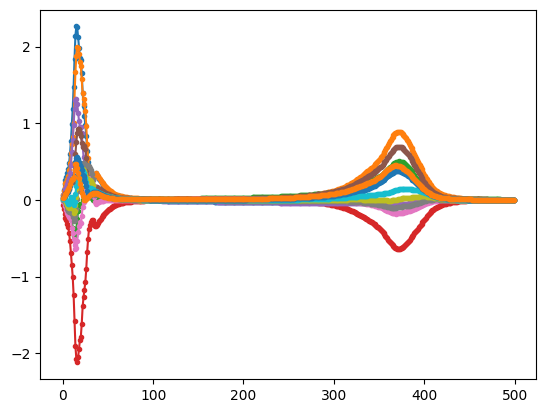

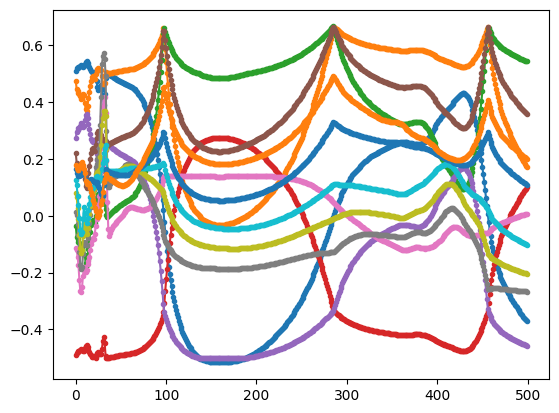

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

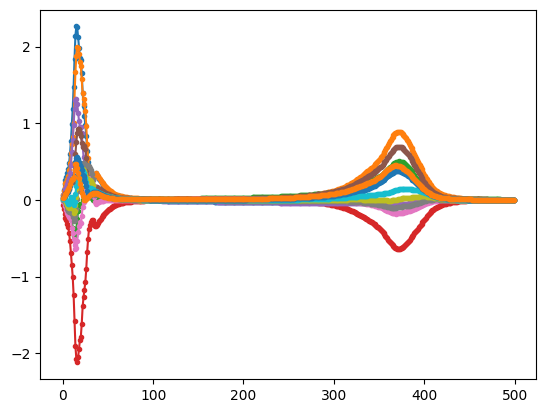

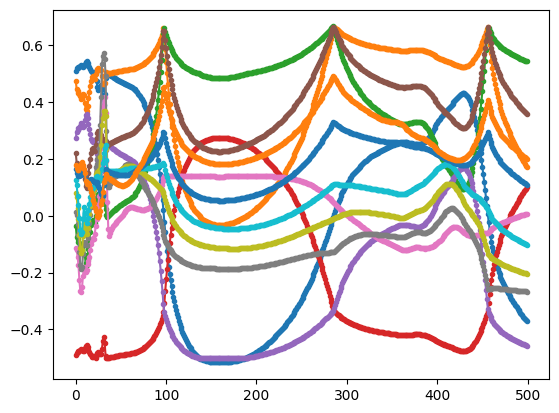

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

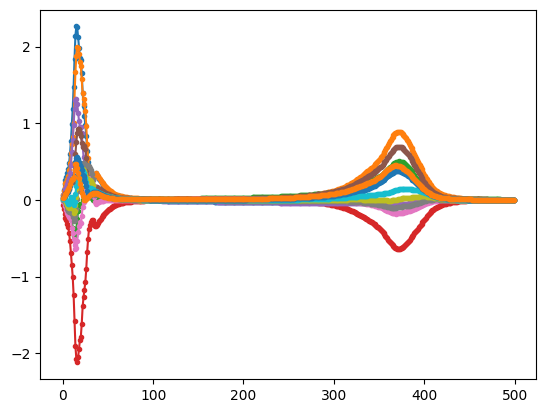

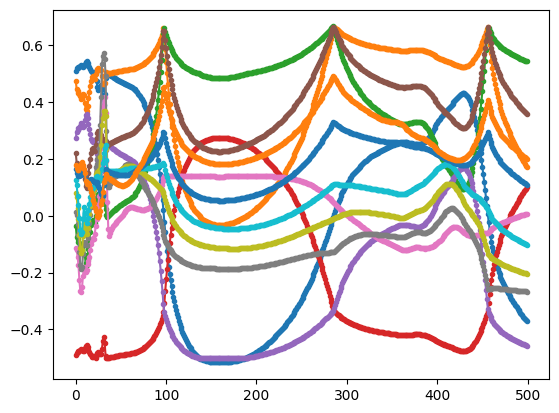

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

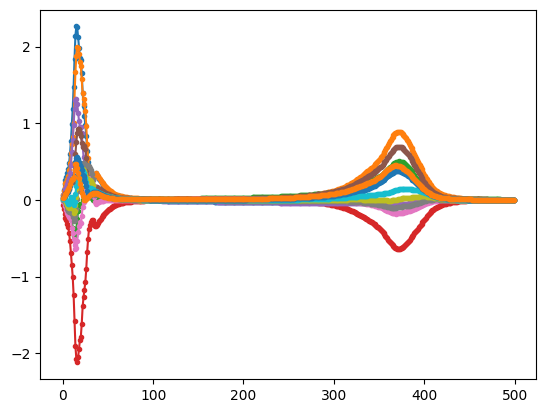

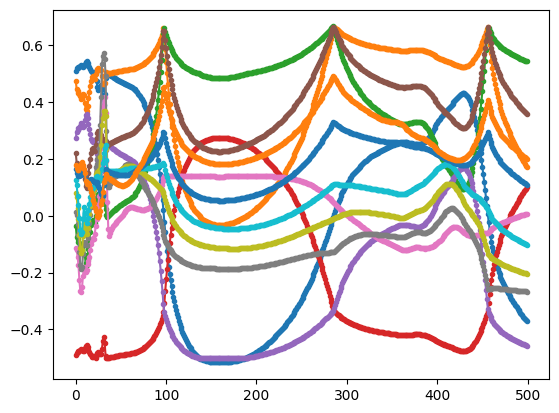

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

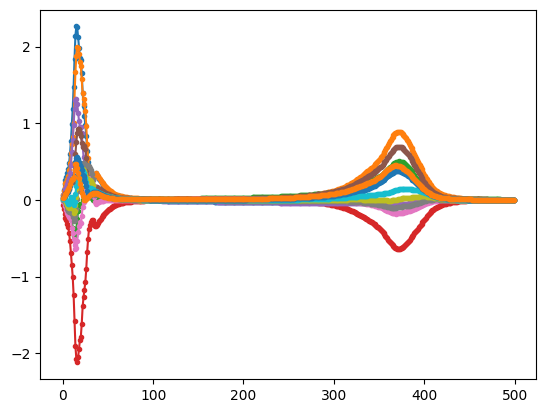

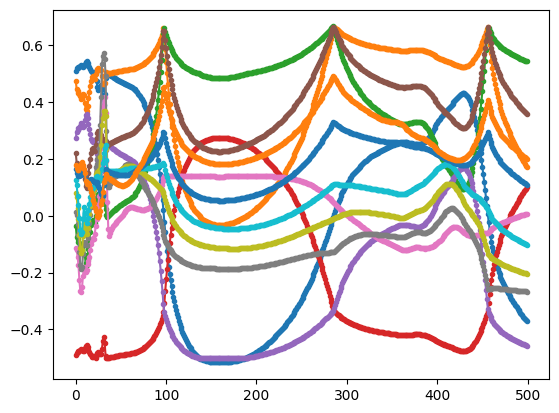

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

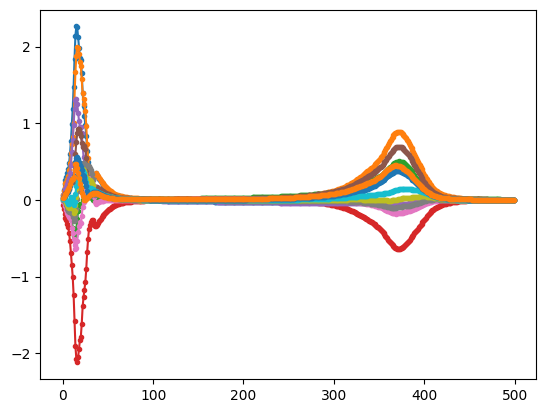

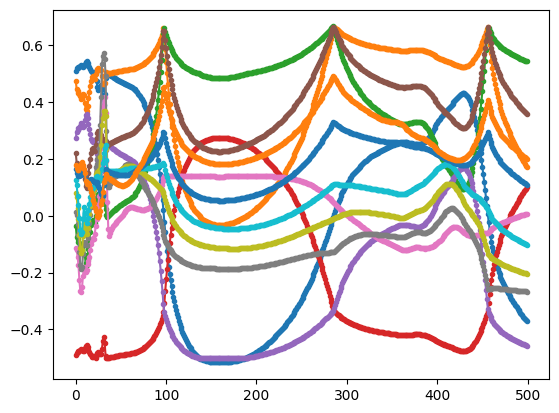

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

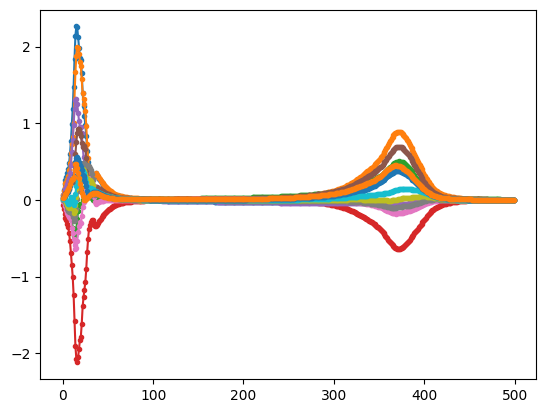

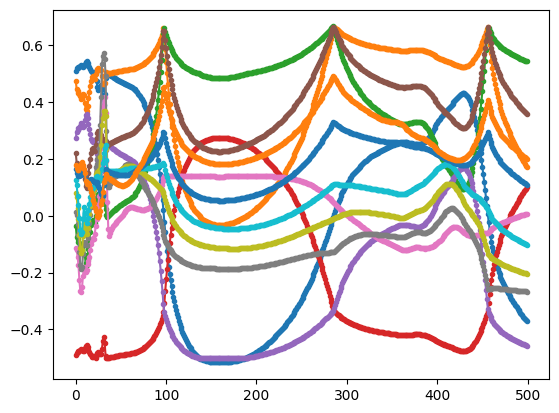

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

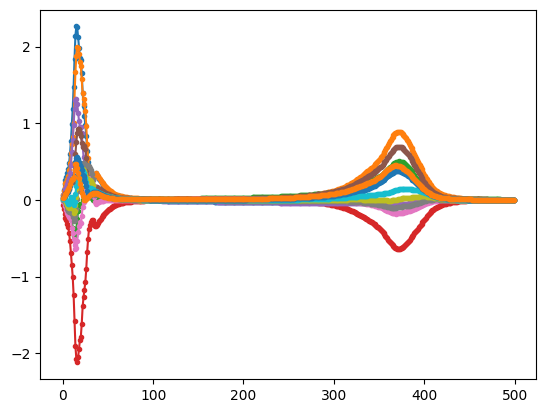

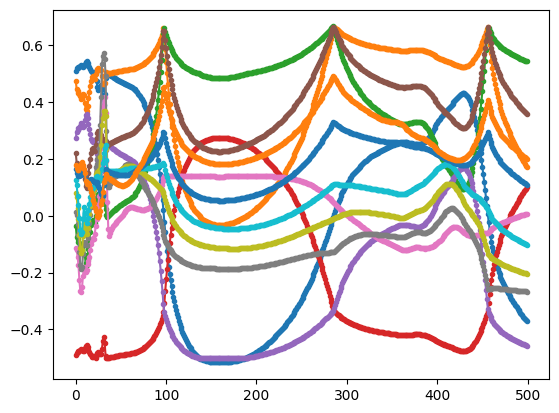

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

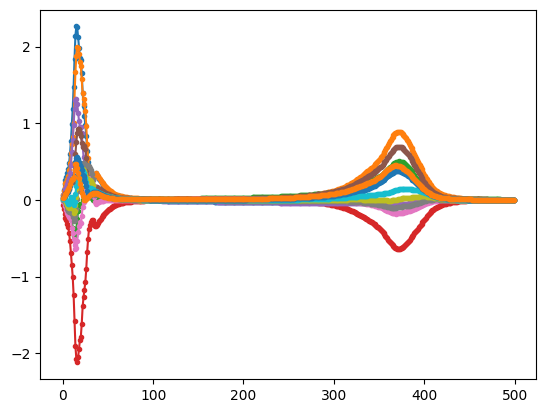

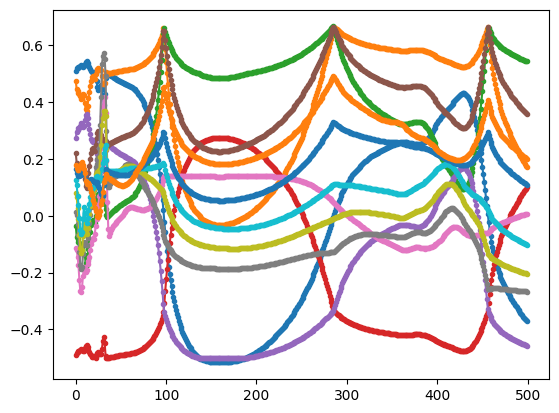

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

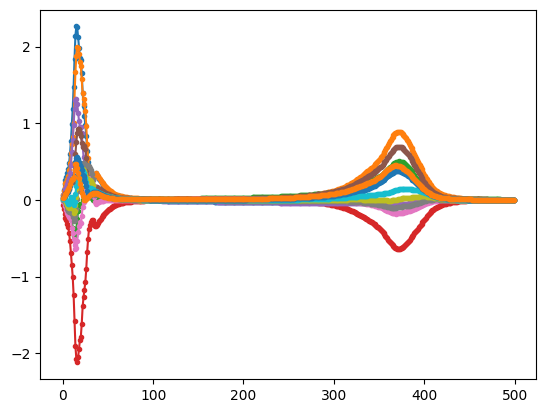

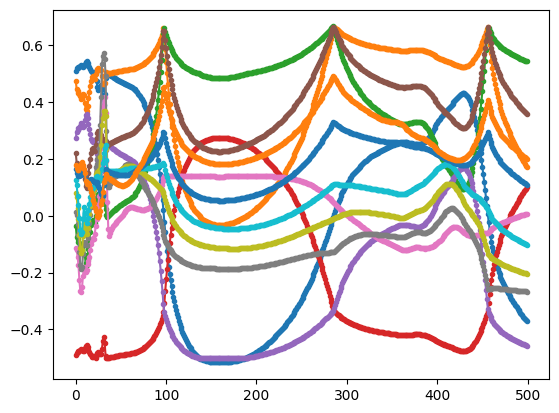

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

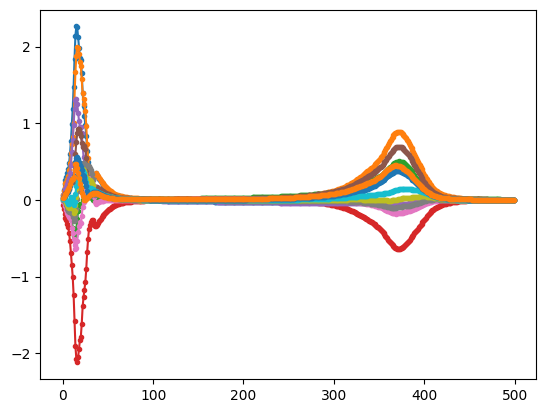

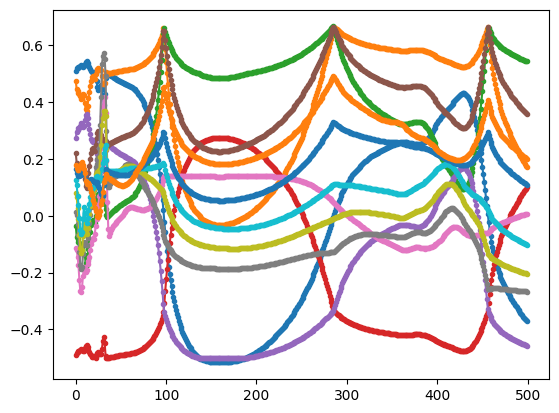

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

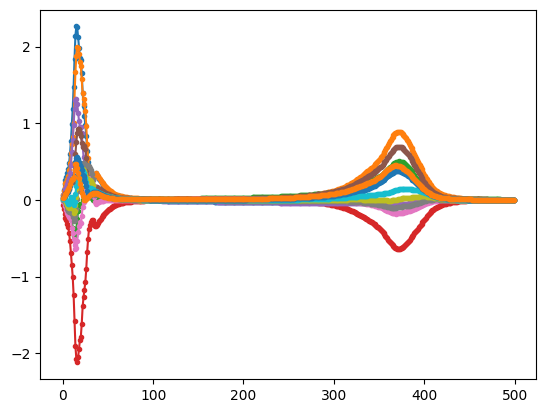

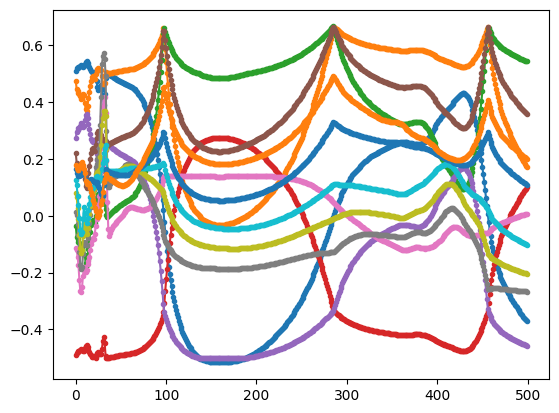

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

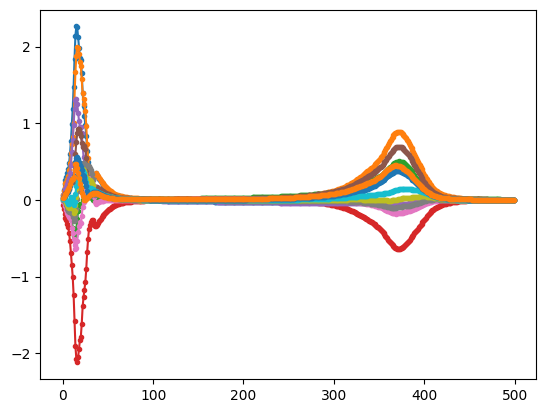

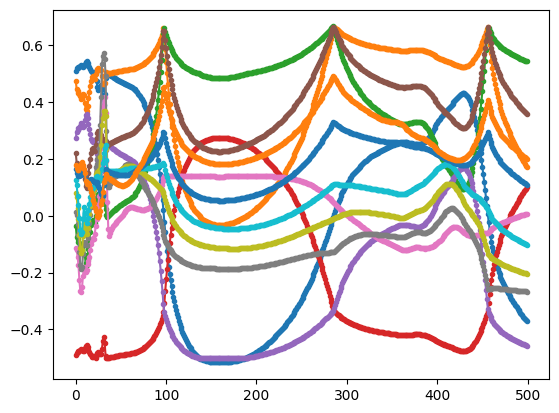

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

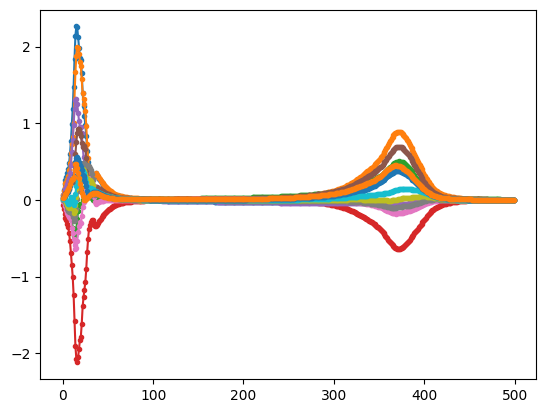

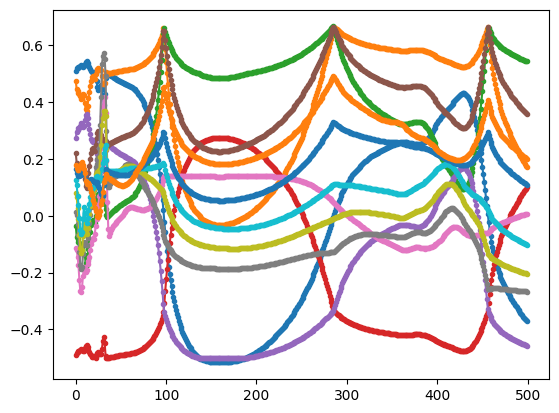

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

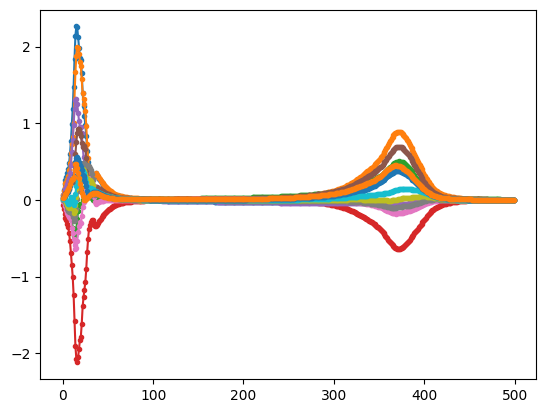

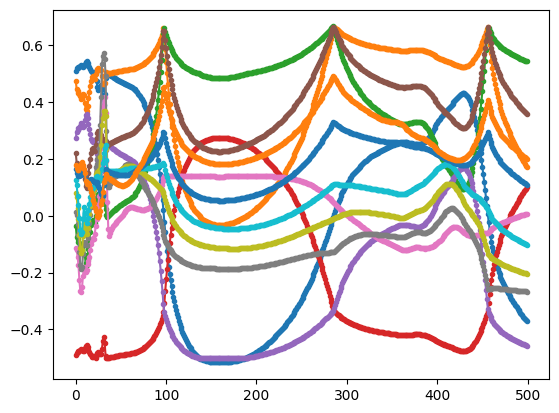

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

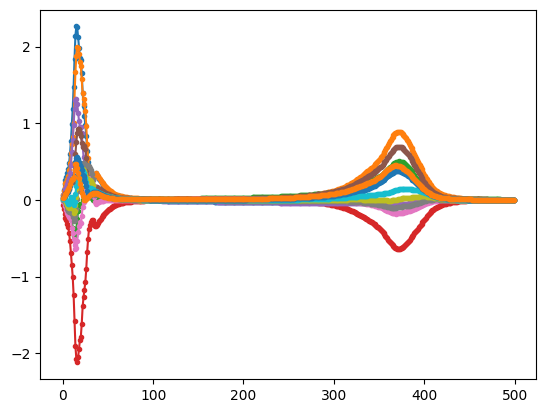

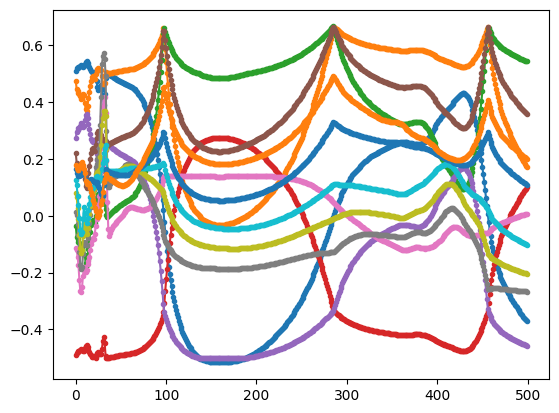

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

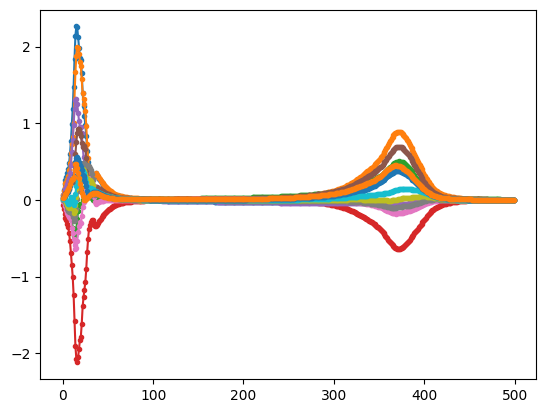

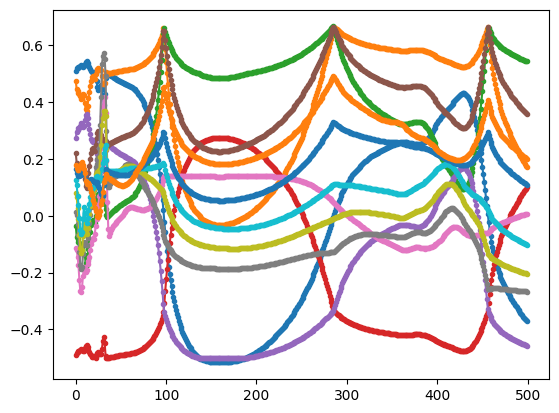

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

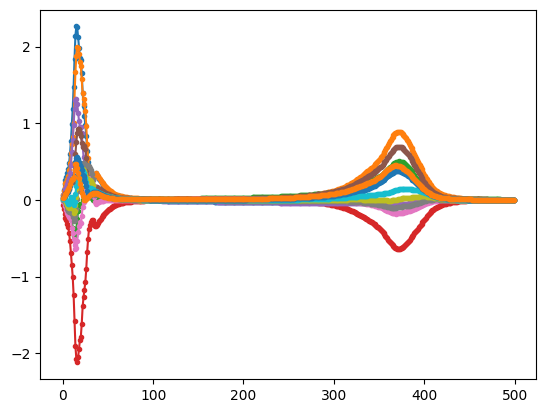

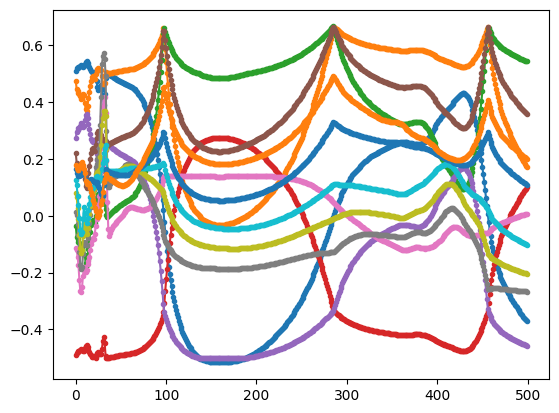

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

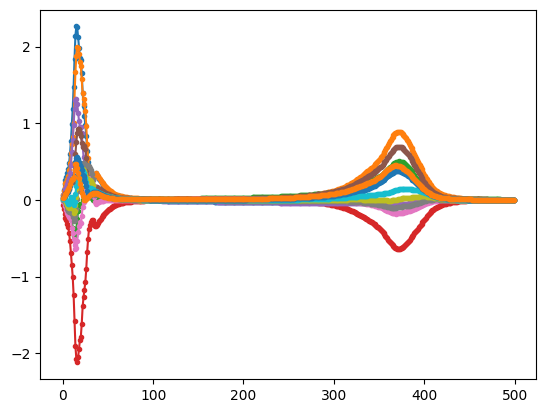

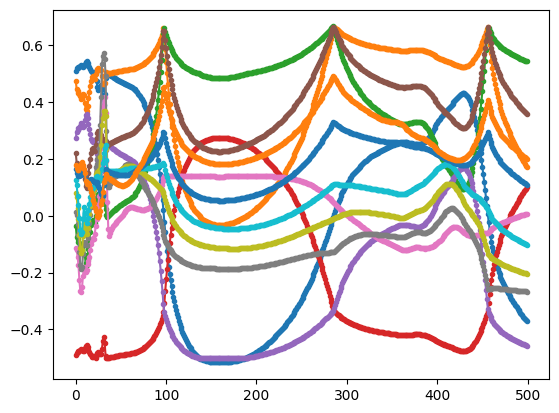

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

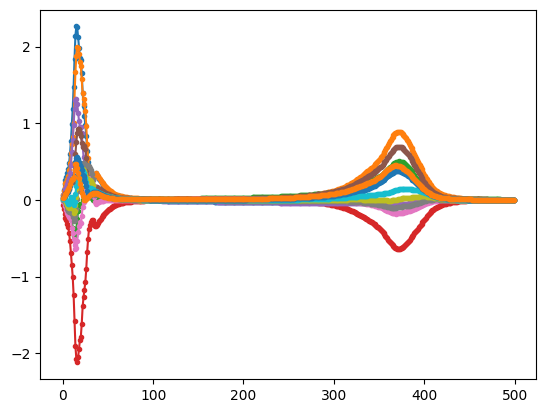

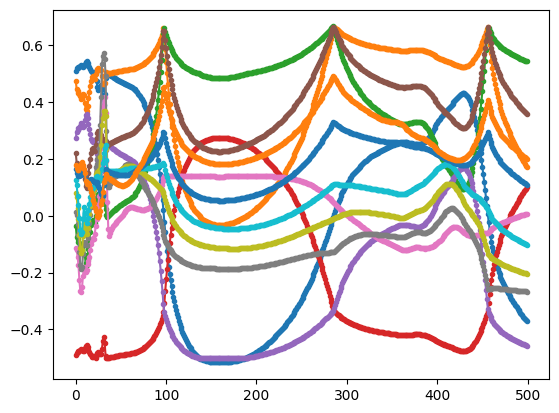

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

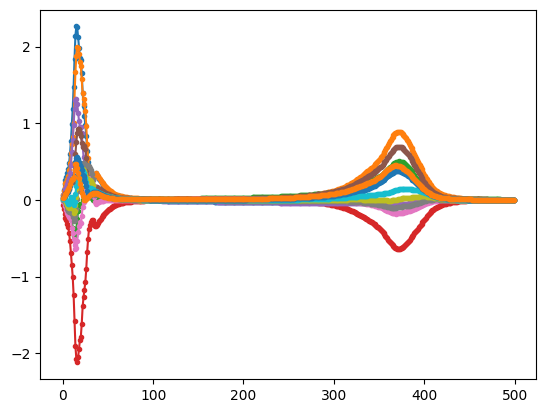

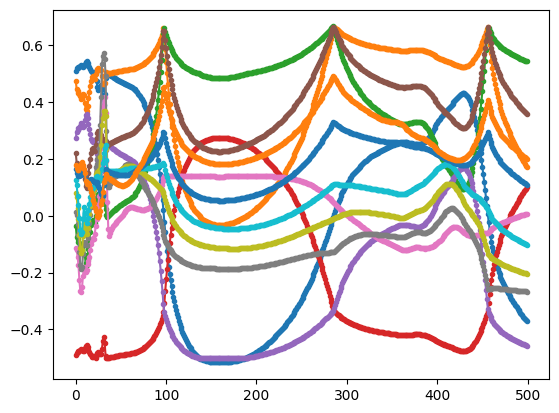

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

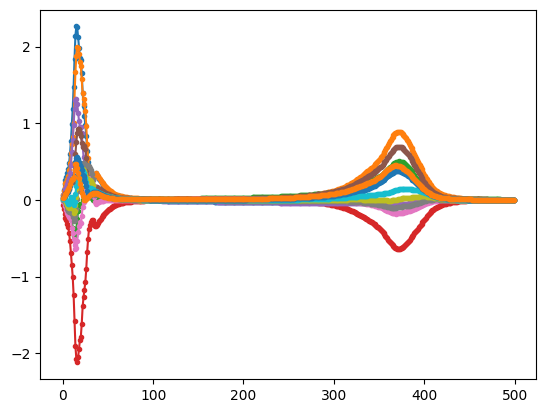

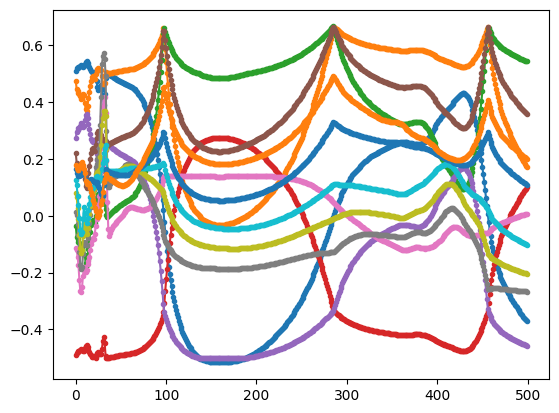

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

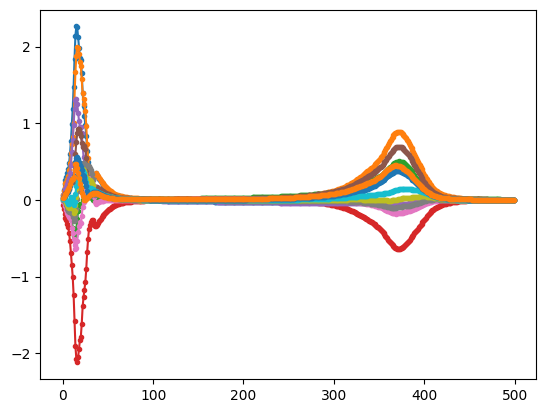

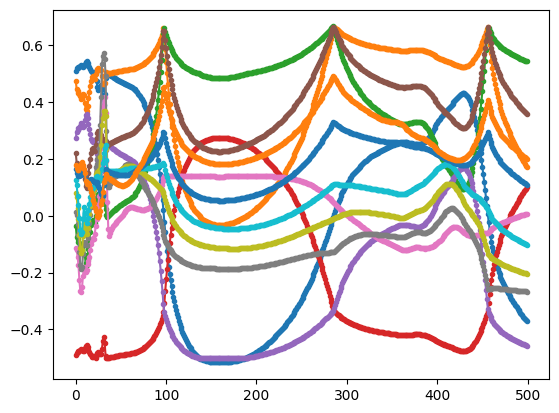

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

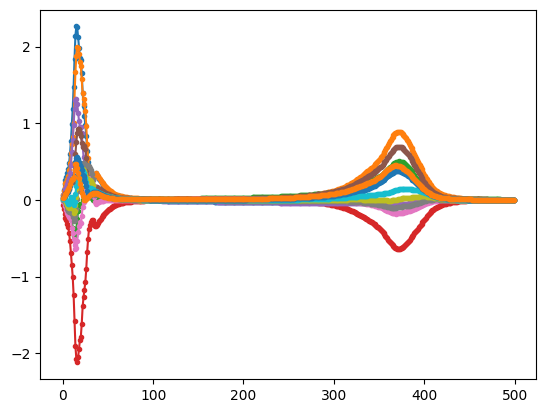

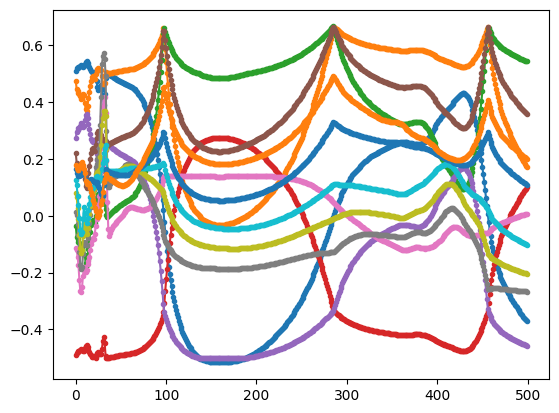

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

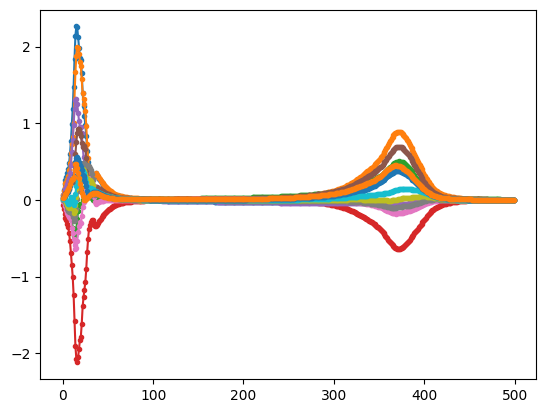

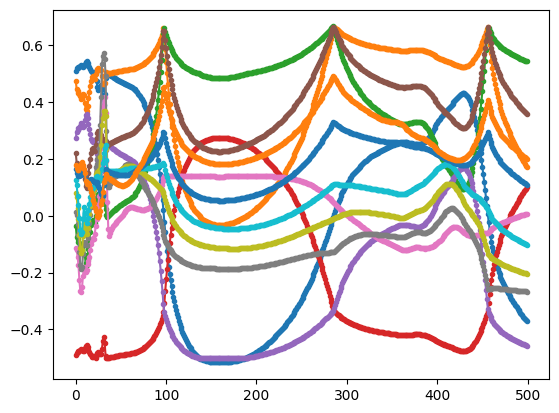

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

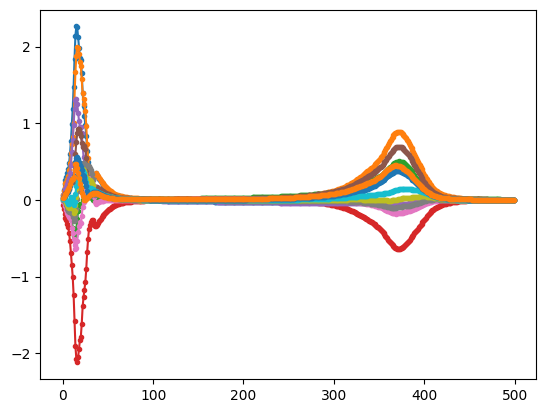

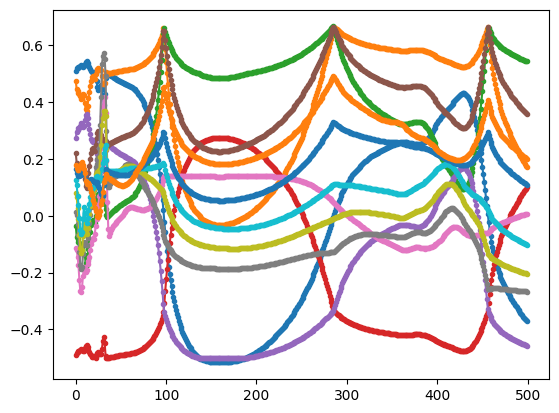

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

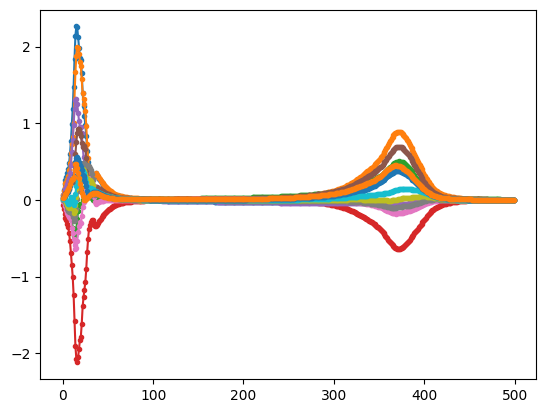

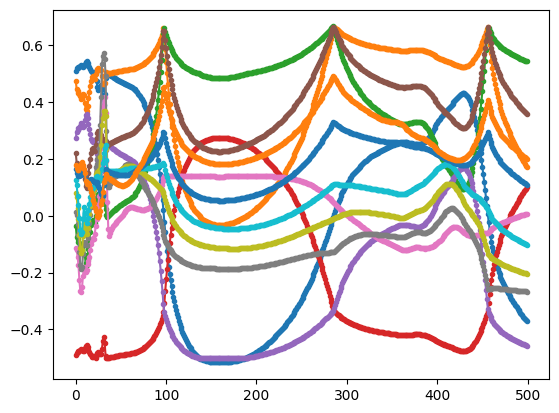

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

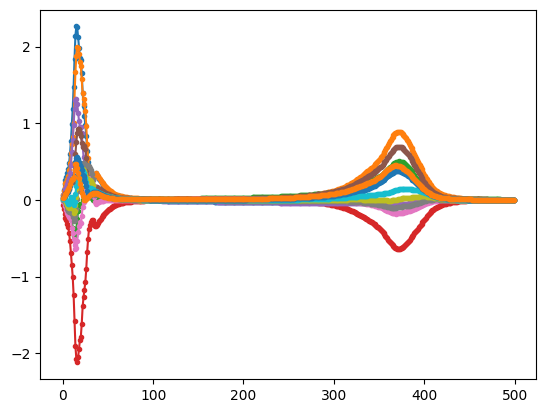

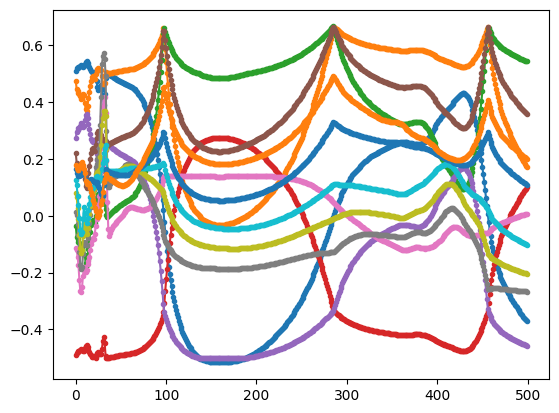

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

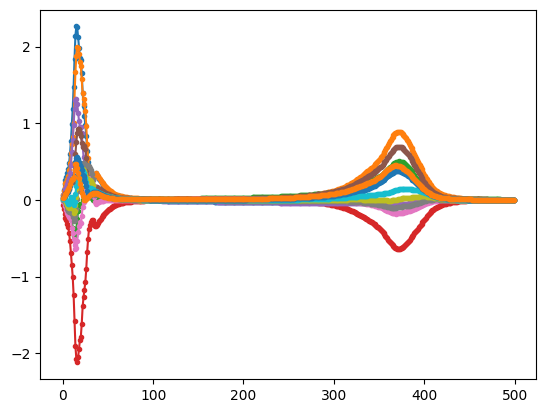

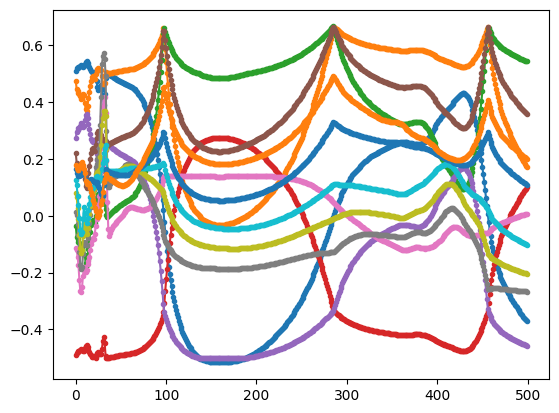

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

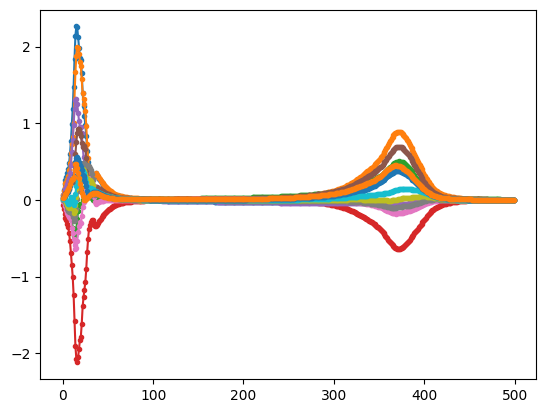

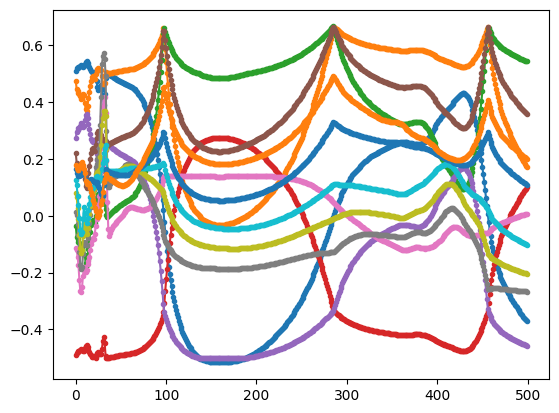

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

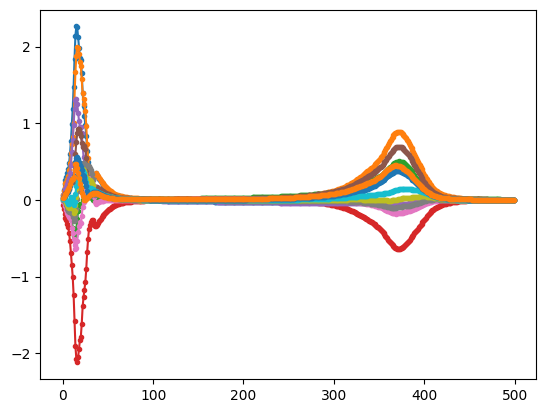

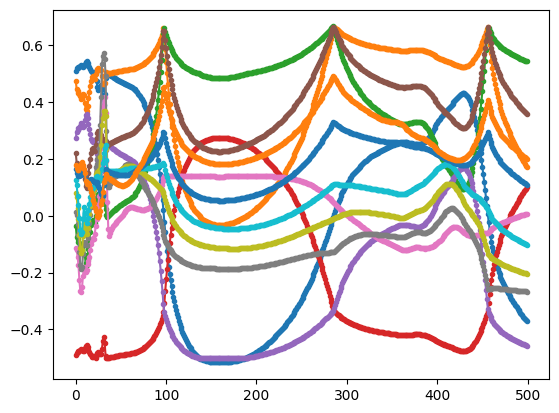

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

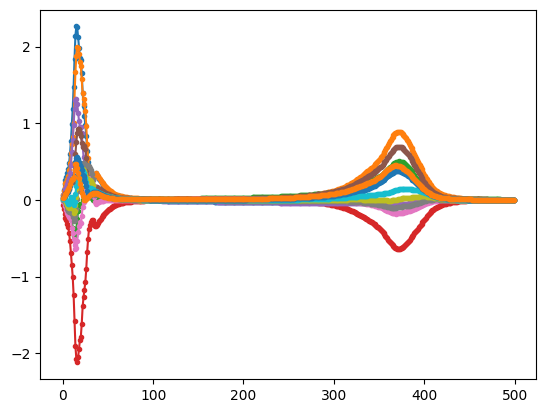

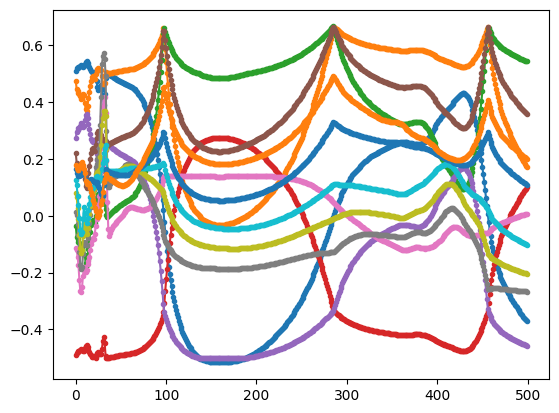

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

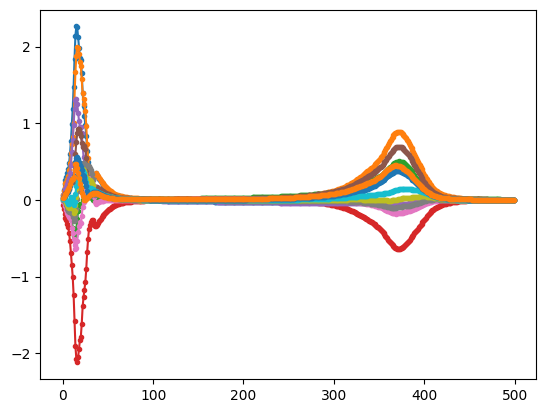

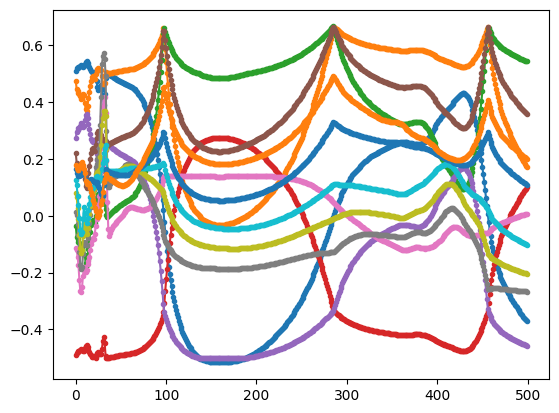

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

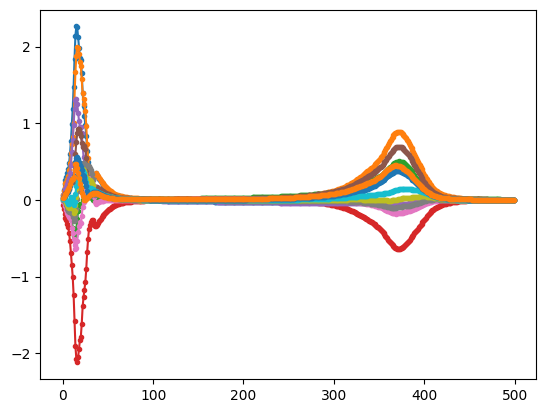

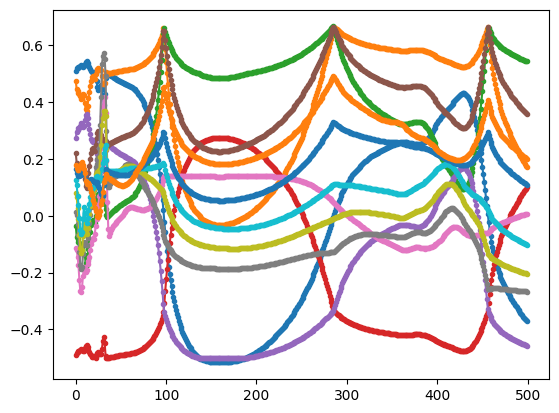

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

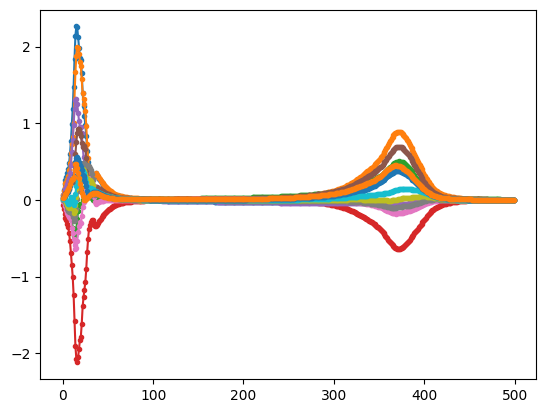

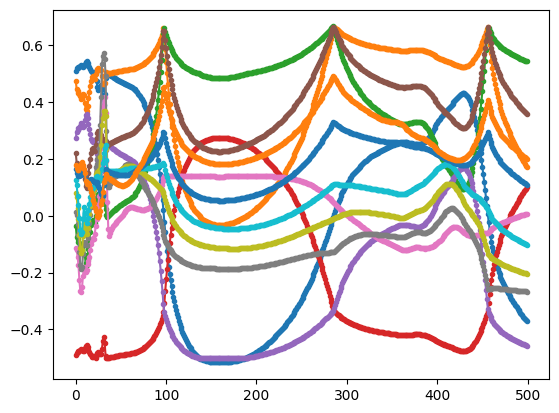

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

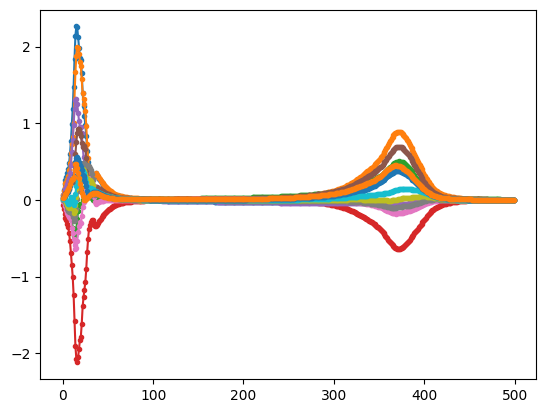

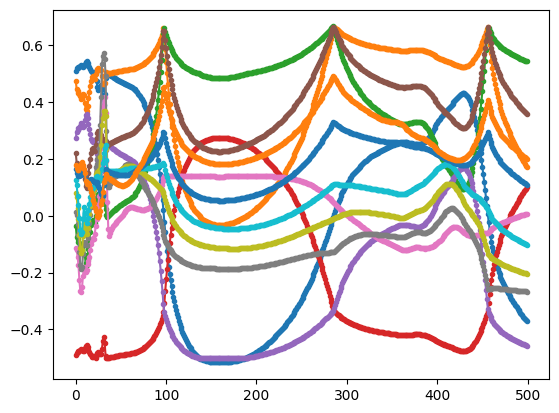

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

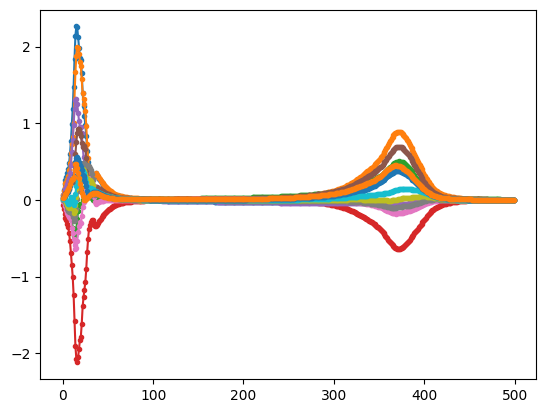

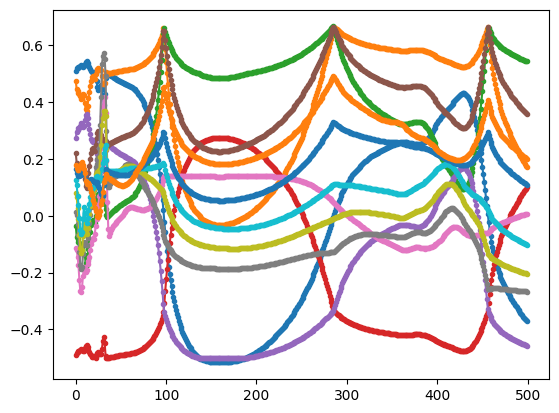

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

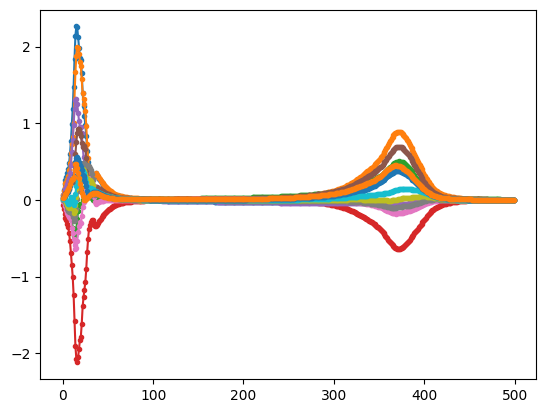

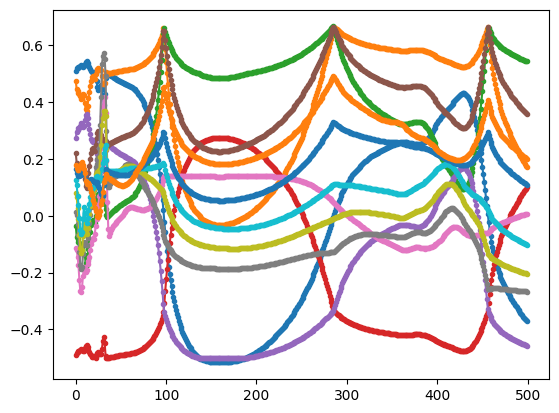

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

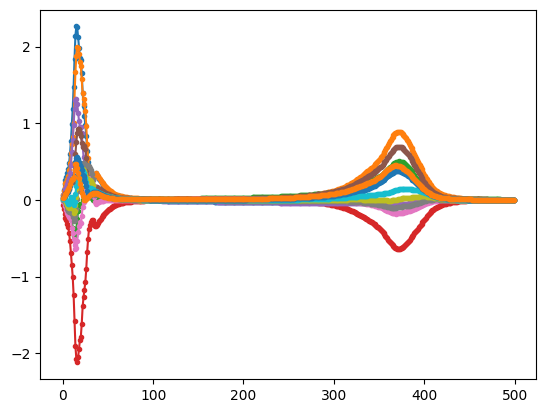

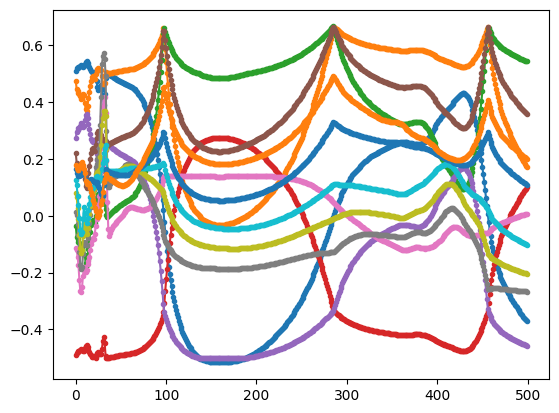

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

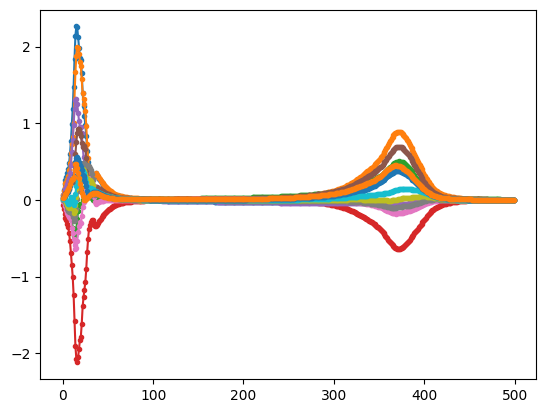

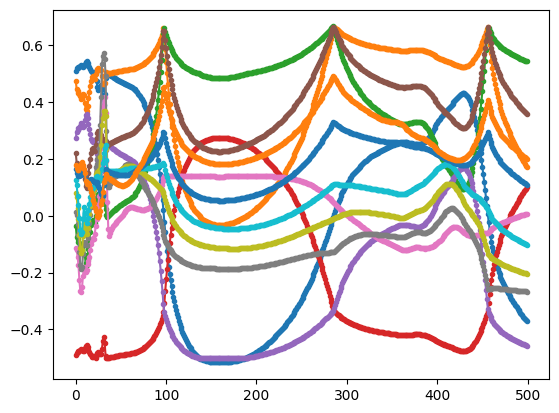

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

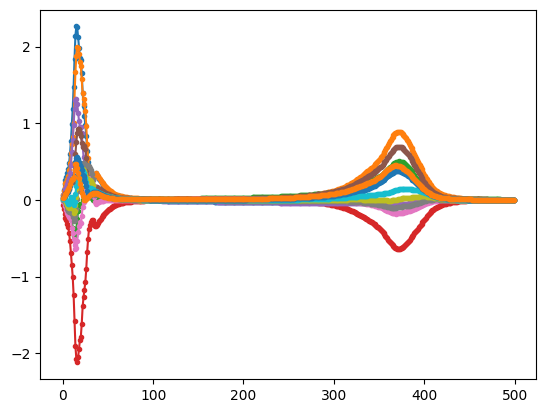

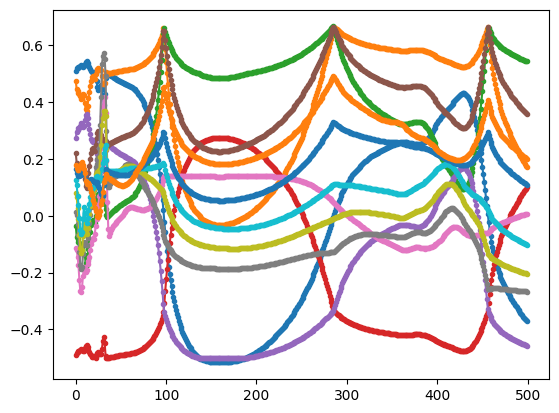

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

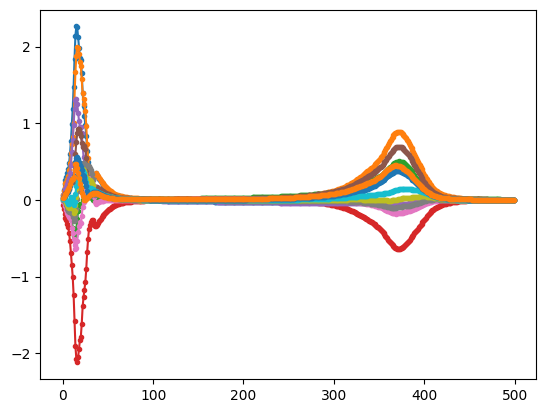

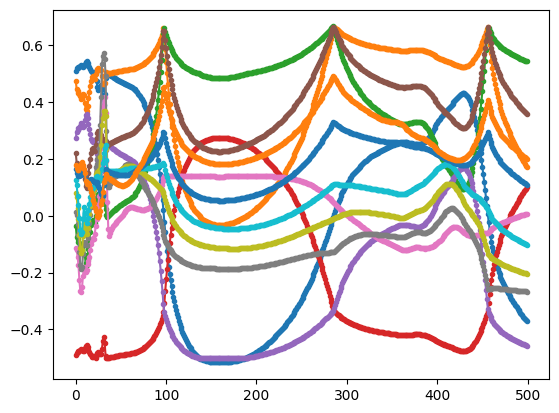

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

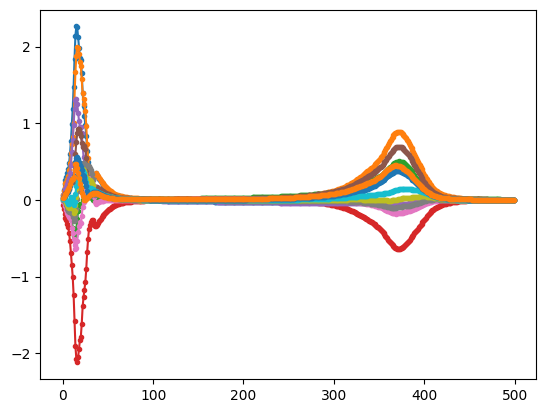

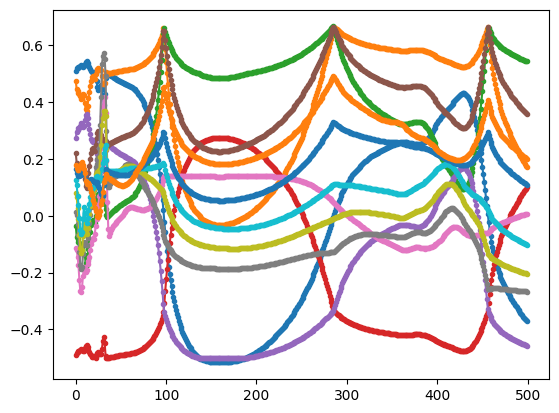

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

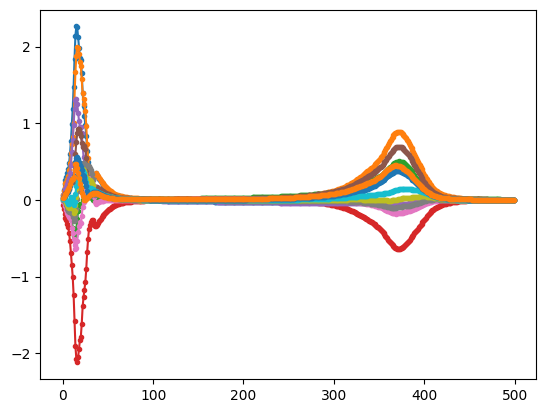

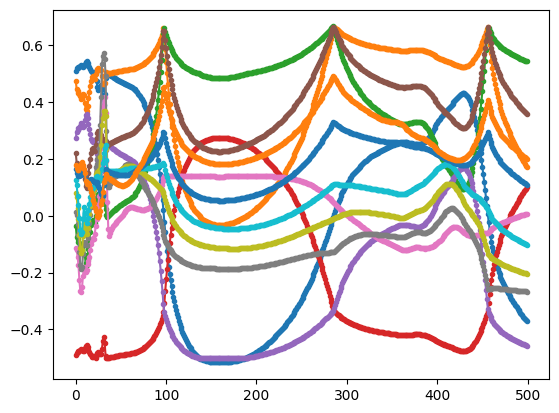

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

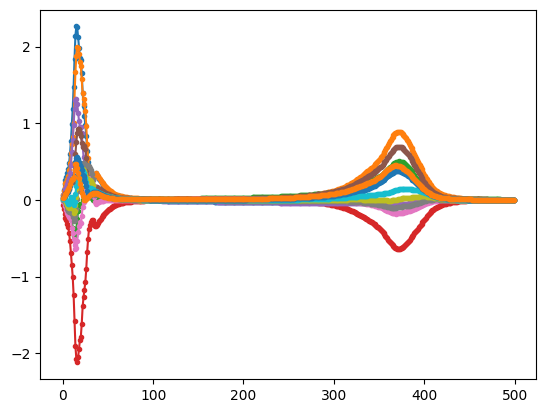

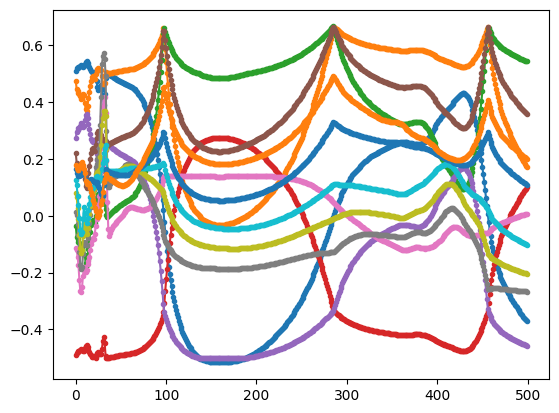

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

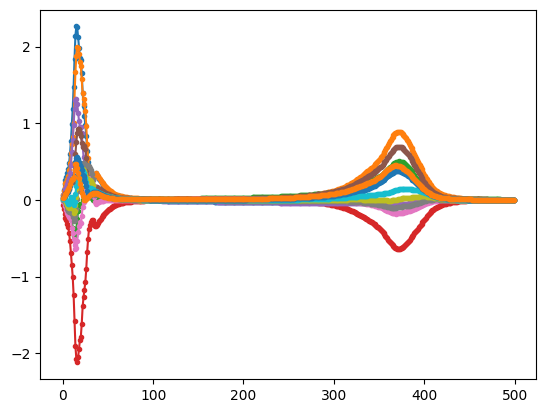

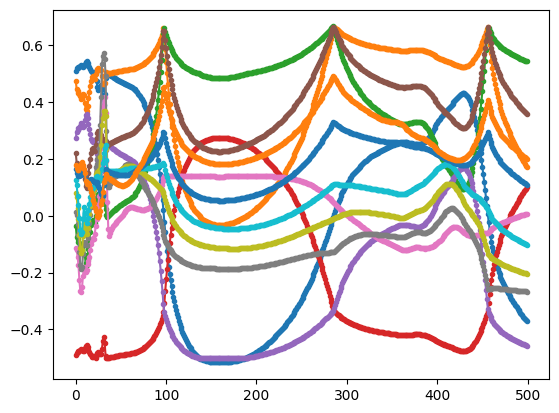

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

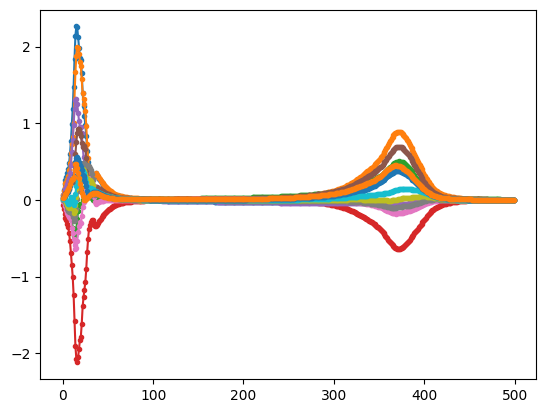

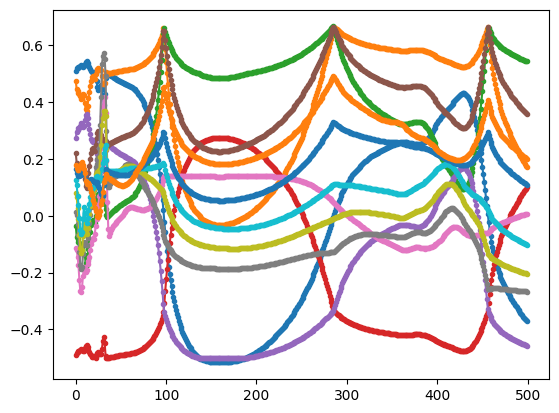

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

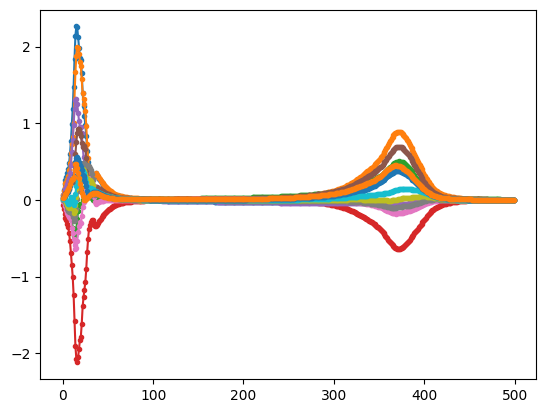

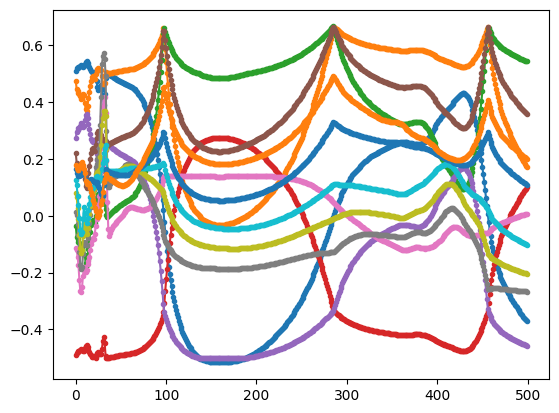

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

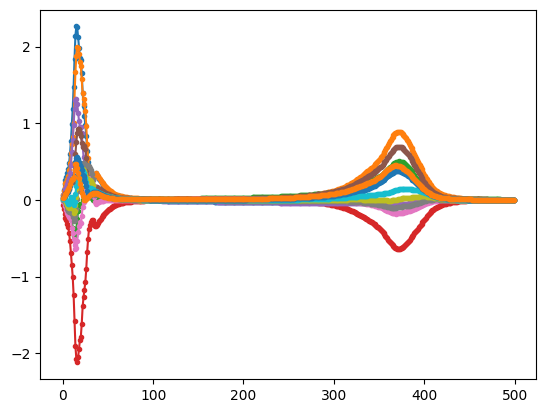

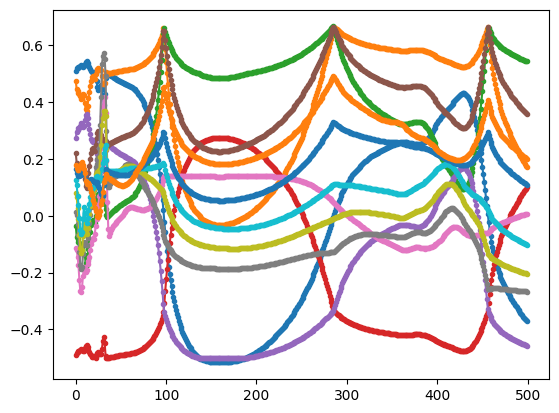

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

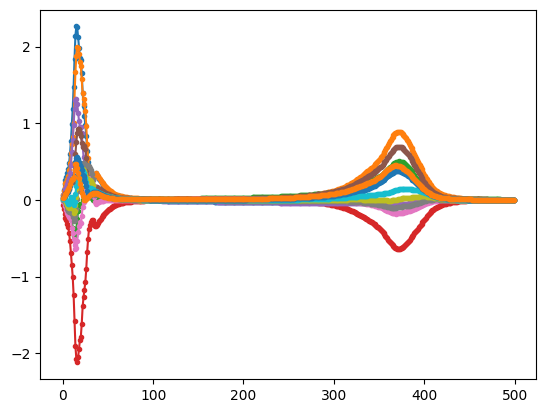

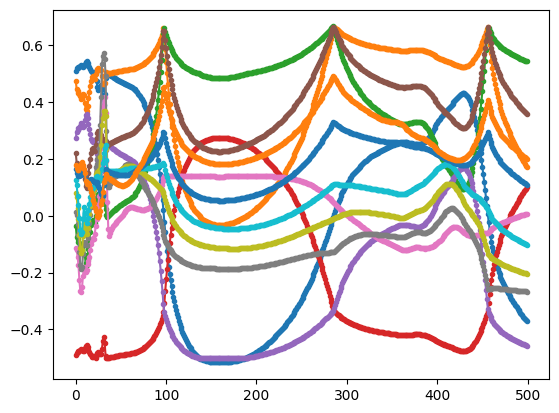

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

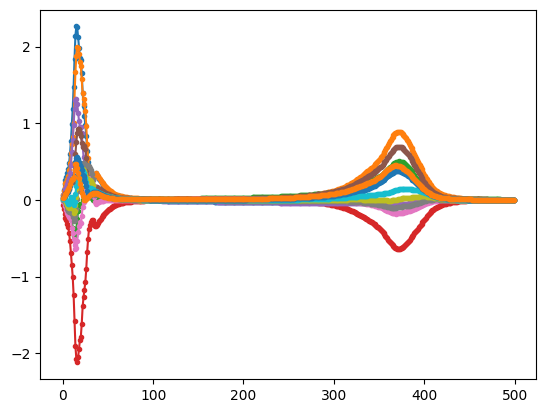

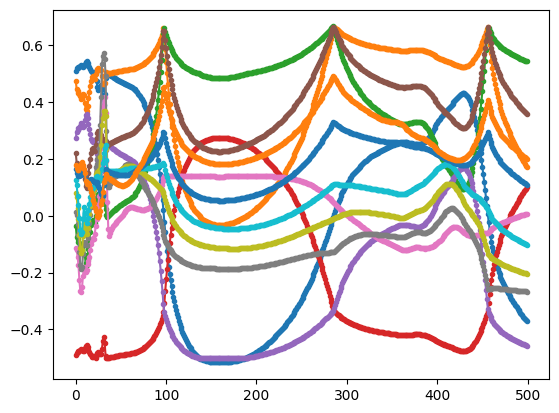

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

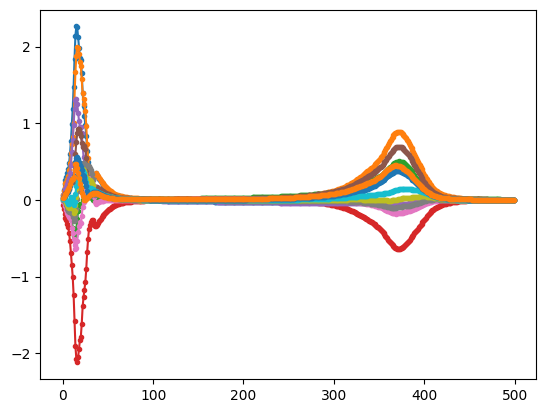

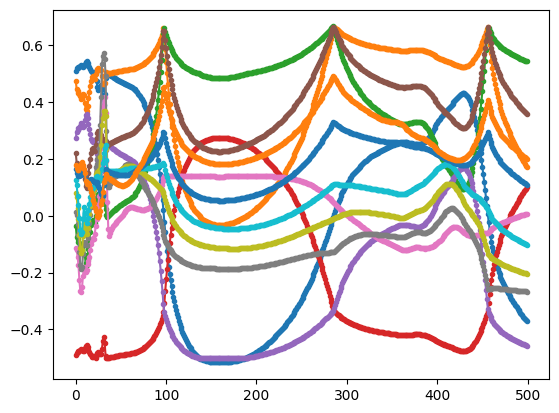

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

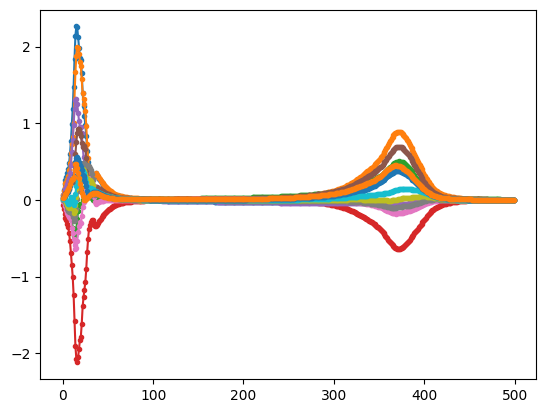

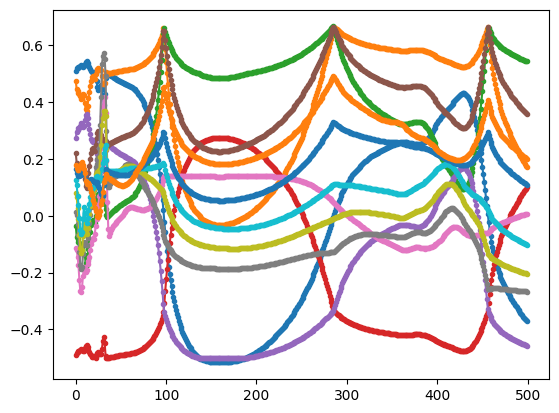

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

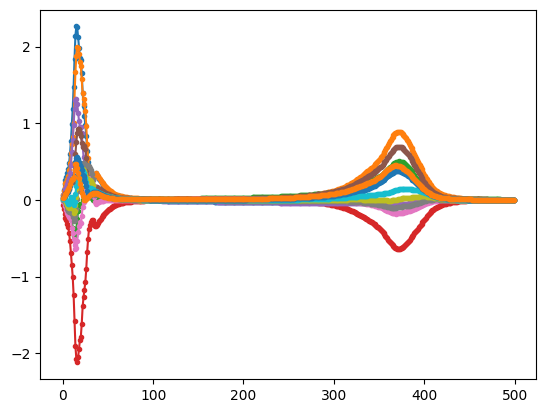

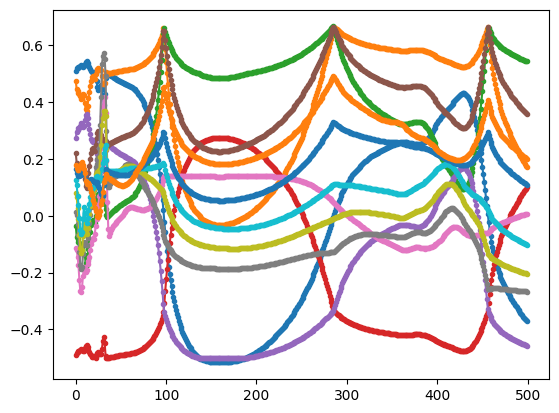

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

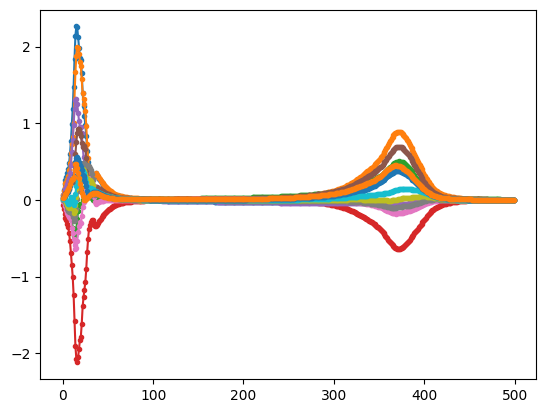

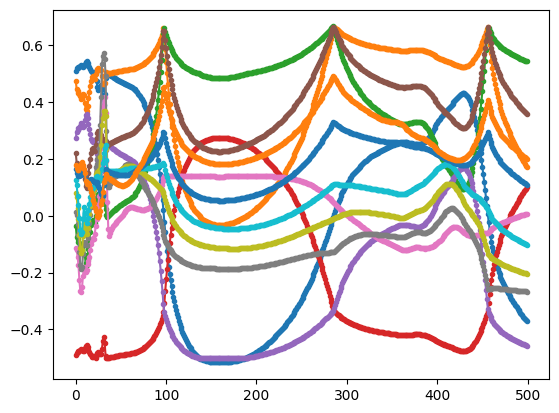

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

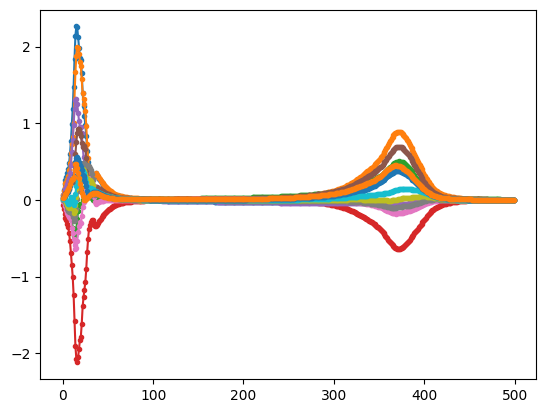

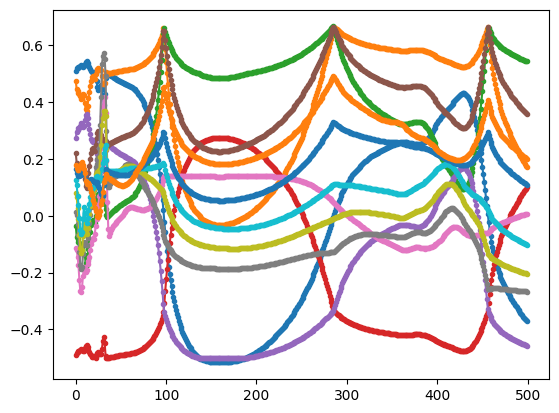

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

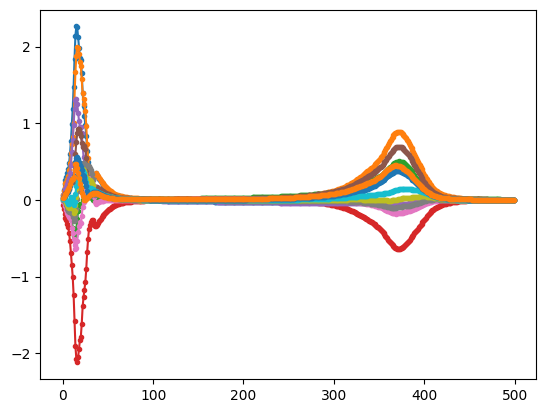

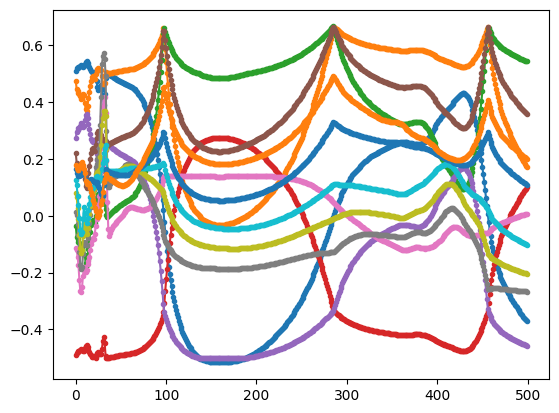

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

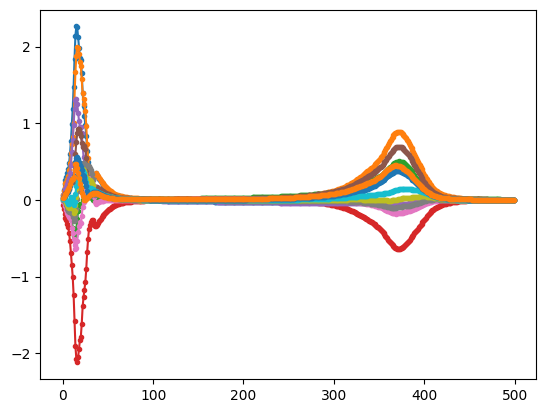

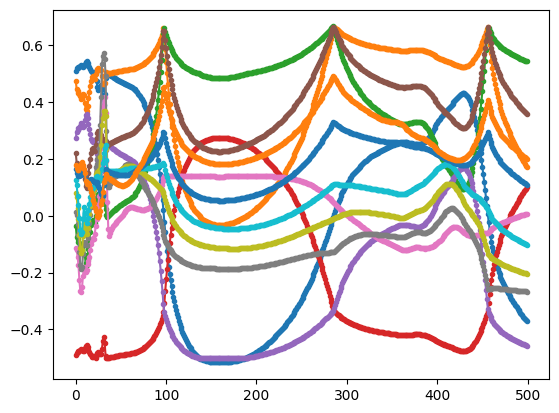

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

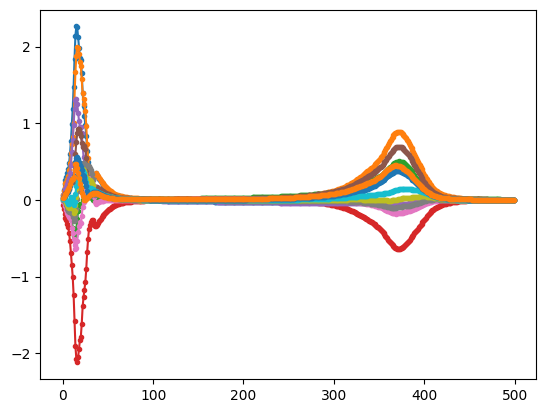

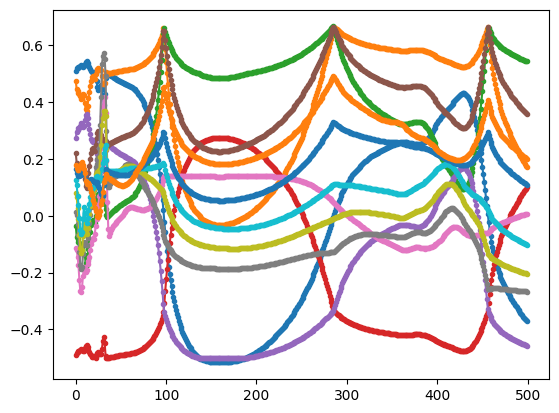

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

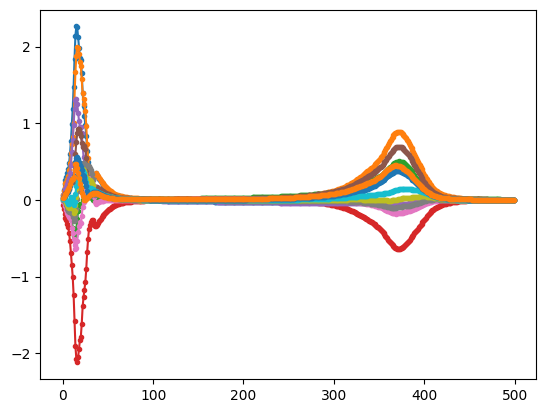

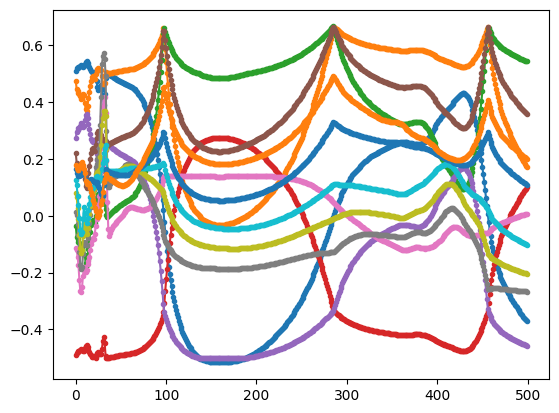

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

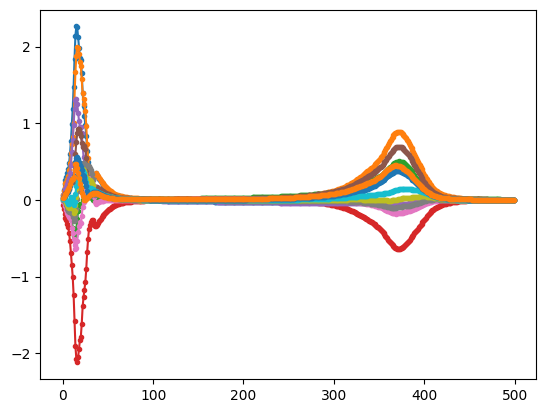

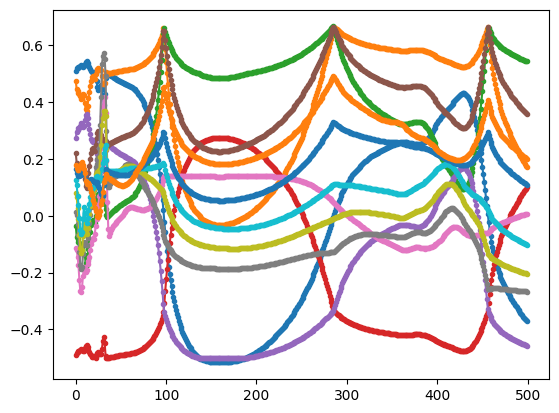

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

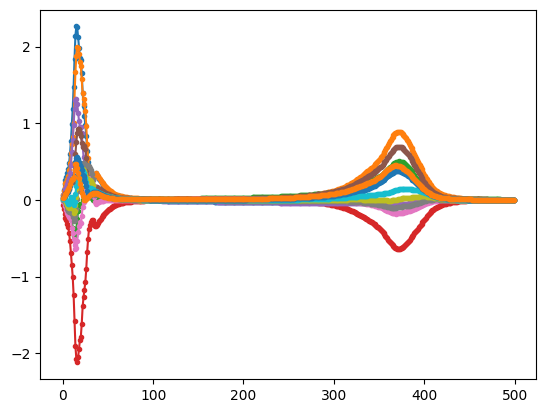

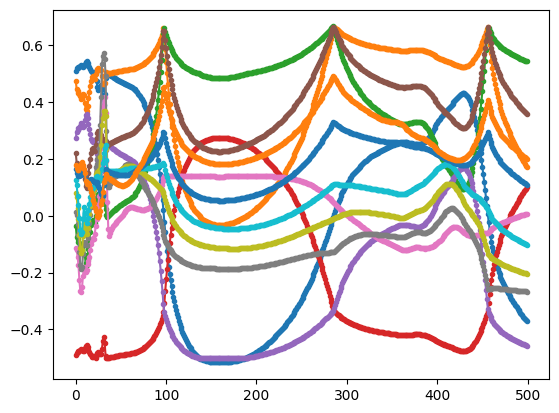

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

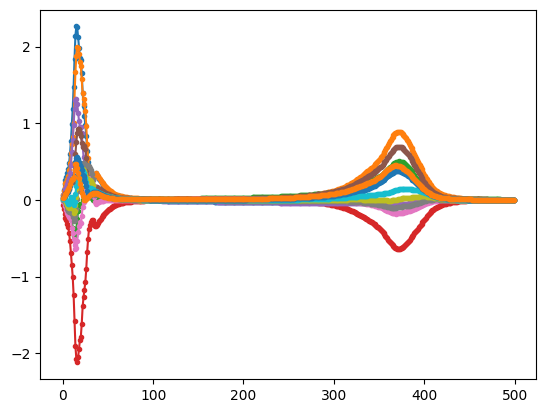

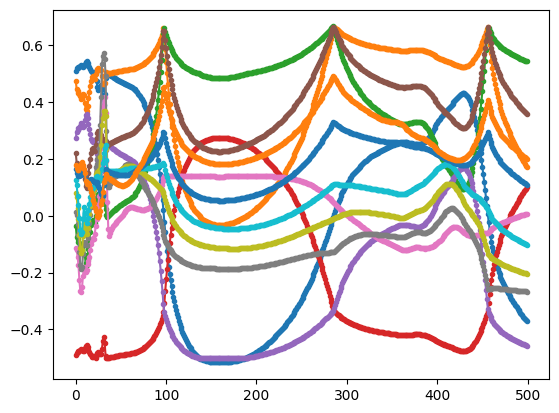

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

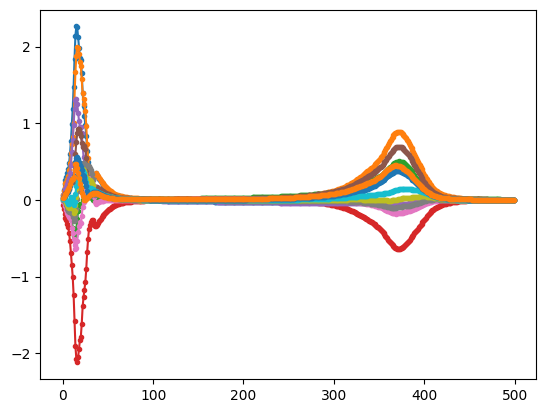

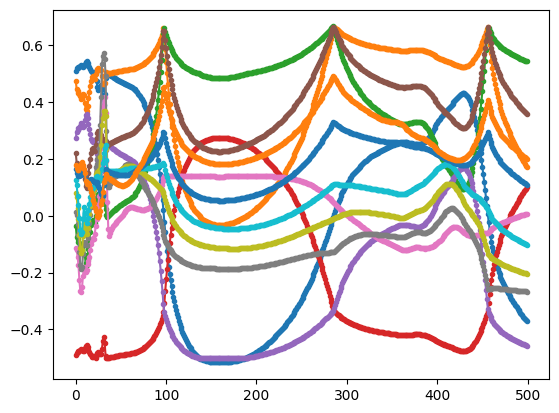

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

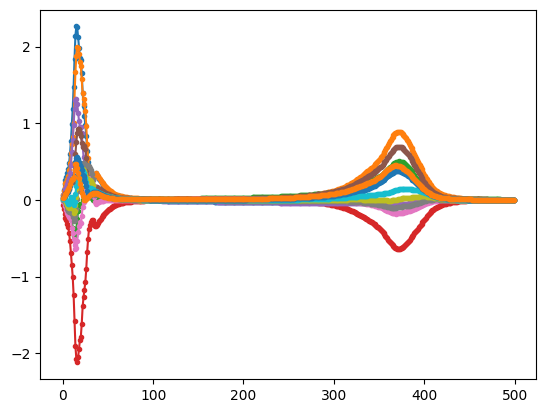

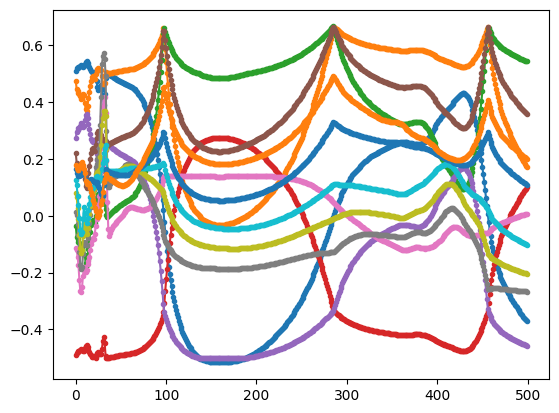

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

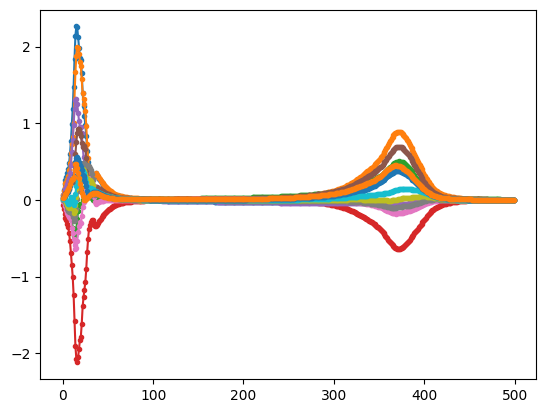

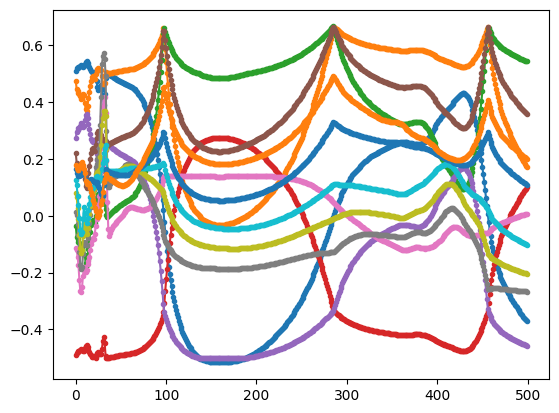

torch.Size([16117, 500, 12]) tensor([[[ 0.5087,  0.4740, -0.0346,  ...,  0.1271,  0.1636,  0.1766],
         [ 0.5184,  0.4449, -0.0735,  ...,  0.1084,  0.1504,  0.1674],
         [ 0.5230,  0.4311, -0.0919,  ...,  0.0706,  0.1407,  0.1622],
         ...,
         [-0.3634,  0.1821,  0.5455,  ..., -0.0982,  0.1138,  0.2057],
         [-0.3677,  0.1764,  0.5441,  ..., -0.0998,  0.1116,  0.2032],
         [-0.3719,  0.1708,  0.5427,  ..., -0.1014,  0.1094,  0.2008]],

        [[ 0.5061,  0.4818, -0.0243,  ...,  0.1540,  0.1845,  0.2196],
         [ 0.5074,  0.4779, -0.0295,  ...,  0.1445,  0.1795,  0.2105],
         [ 0.5089,  0.4733, -0.0356,  ...,  0.0964,  0.1752,  0.2079],
         ...,
         [-0.5604, -0.1209,  0.4396,  ..., -0.1454,  0.0084,  0.0751],
         [-0.5629, -0.1257,  0.4371,  ..., -0.1468,  0.0063,  0.0727],
         [-0.5652, -0.1304,  0.4348,  ..., -0.1482,  0.0043,  0.0703]],

        [[ 0.4912,  0.5029,  0.0117,  ...,  0.1207,  0.1700,  0.1936],
         [ 0.501

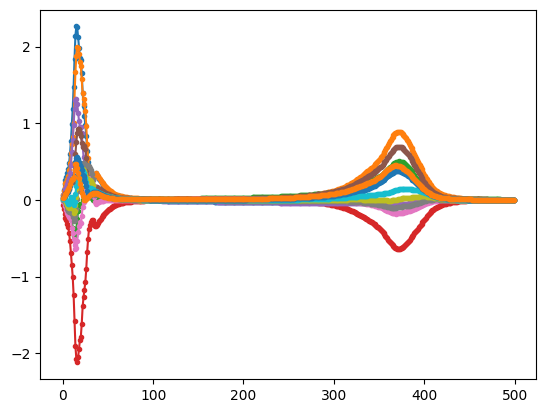

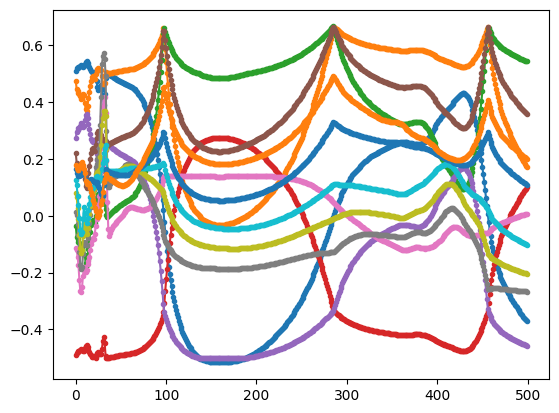

torch.Size([16117, 500, 12]) 

In [46]:
''' NORMALIZATION

ECG Data (500x12) is scaled by:
ecg / ( max(ecg) - min(ecg) )
where min max is from each individual lead in each individual heart sample (smaller scope)
so min max will be from 500x1 for each of 12 leads in each of 16117 hearts

VM Data (500x75) scaled by:
( vm - min(D) ) / ( max(D) - min(D) )
where min max is is from each cardioid point across ALL hearts in dataset (larger scope)
so min max will be from 16117x500 for each of 75 points
'''

def ecg_norm(ecg_data):
  X_norm = torch.zeros((X_tensor.shape[0], X_tensor.shape[1], X_tensor.shape[2]))
  for i, heart in enumerate(ecg_data): # iter through each data sample
    for j, leads in enumerate(heart): # iter through lead values at t = j
      max_ecg = np.max(leads)
      min_ecg = np.min(leads)
      for k, ecg in enumerate(leads): # apply scaler to each value in lead vectors
        X_norm[i][j][k] = ecg / (max_ecg - min_ecg)

    print(X_norm.shape, X_norm)
    plt.figure(1)
    #x_time = np.arange(0,500, 1)
    #unnorm = ecg_data.reshape(ecg_data.shape[0], ecg_data.shape[2],ecg_data.shape[1])
    #print("RESHAPE***",unnorm.shape)
    plt.plot(ecg_data[0],marker='.')
    plt.figure(2)
    #norm = X_norm.reshape(X_norm.shape[0], X_norm.shape[2], X_norm.shape[1])
    plt.plot(X_norm[0],marker='.')
    plt.show()
    


def vm_norm(vm_data):
  pass

X_norm = torch.zeros((X_tensor.shape[0], X_tensor.shape[1], X_tensor.shape[2]))
Y_norm = torch.zeros((Y_tensor.shape[0], Y_tensor.shape[1], Y_tensor.shape[2]))

ecg_norm(ECG_Data)

scaler = MinMaxScaler()
for i, heart_sample in enumerate(X_tensor): # scale X data (ECG leads)
  scaled_sample = scaler.fit_transform(heart_sample)
  X_norm[i] = torch.from_numpy(scaled_sample)
  print(scaled_sample[0])
  break
'''
for i, heart_sample in enumerate(Y_tensor): # scale Y data (Cardioid points)
  scaled_sample = scaler.fit_transform(heart_sample)
  Y_norm[i] = torch.from_numpy(scaled_sample)

print(X_norm[0][100], '\n', Y_norm[0][100]) # reprint sample to show normalized data'''

In [ ]:
class ConvNet(nn.Module):
  def __init__(self, input_size, output_size):
    super(ConvNet, self).__init__()

    self.c1 = nn.Conv1d(in_channels=input_size, out_channels=485, kernel_size=16, padding=1)
    self.c2 = nn.Conv1d(in_channels=485, out_channels=470, kernel_size=16, padding=1)
    self.c3 = nn.Conv1d(in_channels=475, out_channels=460, kernel_size=16, padding=1)
    self.c4 = nn.Conv1d(in_channels=460, out_channels=450, kernel_size=11, padding=1)

    self.relu = nn.ReLU()
    self.features = self._get_conv_out_size
    self.fc = nn.Linear(self.features, output_size)

  def forward(self, x):
    x = self.relu(self.conv1(x))
    x = self.relu(self.conv2(x))
    x = self.relu(self.conv3(x))
    x = self.relu(self.conv4(x))

    x = x.view(-1, self.features)
    return self.fc(x)

def _calculate_conv_output_size(self, input_size):
    # Create a dummy input tensor to calculate the output size
    x = torch.randn(1, input_size, 100)  # Assuming input size is 100

    x = self.conv1(x)
    x = self.conv2(x)
    x = self.conv3(x)
    x = self.conv4(x)

    # Calculate the number of features after the convolutions
    return x.view(1, -1).size(1)


model = ConvNet(500, 75)

AttributeError: ignored